# ***Ristek 2022 Open Recruitment (StarCraft)***

***by Bryan Tjandra***

This section is divided to 8 different parts :
* General Helper Method -> Defining method for general purpose in data science problem
* Special Helper Method -> Defining specified method for ristek 2022 dataset
* Prepare Data -> Prepare data train and test
* EDA -> Analysis data
* Feature Engineering -> Modified certain features
* Main1 -> Execution type 1 (Predicting straightly mathcup target)
* Main2 -> Execution type 2 (Merging prediction of P1 & P2 Race with each player features)
* Main3 -> Execution type 3 (Merging prediction of P1 & P2 Race with all features)

## General Helper Method

In [123]:
# Import needs
import gdown
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import math
import warnings
warnings.filterwarnings("ignore")

In [124]:
pip install catboost scikit-optimize --quiet

In [125]:
# Load data from drive
def load_data(link, id=False):
  # Download data from gdrive
  meta_url = 'https://drive.google.com/uc?id='
  url = meta_url + link
  output = 'data.csv'
  gdown.download(url, output, quiet=True)
  data = pd.read_csv(output)

  # Setting id for dataset
  if id:
    data.set_index(id, inplace=True)

  return data

In [126]:
# Check data info 
def info_data(data, unique_object=5, unique_number=15):
  # General info about data
  print("Data shape:",data.shape)
  object_data = list(data.select_dtypes(include= 'object').columns)
  num_data = list(data.select_dtypes(exclude= 'object').columns)
  print('Total categorical:', len(object_data))
  print('Total numerical:', len(num_data),'\n')
  
  # Info for object columns
  if object_data:
    many_unique = [x for x in object_data if (data[x].nunique() > unique_object or data[x].nunique()==1)]
    print(f'Categorical with >{unique_object} or 1 unique:', len(many_unique), '\n')
    print(data[many_unique].nunique().sort_values(),'\n')

  # Info for number columns
  few_unique = [x for x in num_data if data[x].nunique() < unique_number]
  print(f'Numerical with <{unique_number} unique:', len(few_unique), '\n')
  print(data[few_unique].nunique().sort_values(),'\n')

In [127]:
# Check missing value
def missing_data(data, null_percentage=25):
  # Check total missing value
  null = data.isnull().sum()
  print(f"Missing columns total: {(null!=0).sum()}/{len(data.columns)}")
  print("Missing columns name:", ', '.join([x for x in data.columns if data[x].isnull().any()]))

  # Check value with many missing
  over_percentage = null[null > (null_percentage/100*data.shape[0])]
  print(f"Null columns over {null_percentage}% data:", over_percentage.shape[0],'\n')
  print(over_percentage.sort_values())

In [128]:
# Plot missing value
def plot_missing_data(data):
  plt.figure(figsize=(10,10))
  return px.imshow(data.isnull()/1,  width=600, height=400,
                   title ="Missing Value")

In [129]:
# Plot missing value
def plot_correlation(data, start=0, max_number=None, annot=False):
  if max_number == None:
      max_number = data.shape[1]
  num_data = (data.select_dtypes(include= 'number')).iloc[:,start:max_number]
  plt.figure(figsize=(10,7))
  
  # Plot correlation with heatmap
  sns.heatmap(num_data.corr(),cmap=plt.cm.Reds,annot=annot)
  plt.title('Data Correlation',fontsize=20)
  plt.show()

In [130]:
# Pairplot data
def pairplot_data(data, target, number_pair=5, hue=None, hue_order=None, dropna=False):
  sns.set(rc={'figure.figsize':(11.7,8.27)})
  dependent_var = data[target]
  temp_data = pd.concat([data.select_dtypes('number').iloc[:,:number_pair], dependent_var], axis=1)
  sns.pairplot(temp_data,hue=hue,hue_order=hue_order, dropna=dropna, diag_kind='kde',palette='Set3')

In [131]:
# Distribution plot data
def dist_data(train_data, test_data=None, kind='dist', dtype='number', max_number=None, start=0, 
              unique_object=5, compare=True, color='g', hue=None):

  if max_number == None:
      max_number = train_data.shape[1]

  # Checking for numerical distrbution or categorical
  if dtype == 'number':
    type_data = list(train_data.select_dtypes(include= 'number').columns)[start:max_number]
    plot = sns.distplot if kind=='dist' else sns.boxplot 
  else:
    object_data = list(train_data.select_dtypes(include= 'object').columns)
    type_data = [x for x in object_data if train_data[x].nunique() <= unique_object][start:max_number]
    plot = sns.countplot 

  # Comparing distribution with test set
  if compare:
    fig , ax = plt.subplots(len(type_data), 2, figsize=(10,max_number*1.2))
    flag = True
    for i,j in zip(type_data , ax):
      try:
        plot(train_data[i], ax=j[0], color=color)
        plot(test_data[i], ax=j[1], color=color)        
      except:
        plot(train_data[i], ax=j[0], palette='mako', hue=hue)
        plot(test_data[i], ax=j[1], palette='mako', hue=hue)
      if flag:
        j[0].set_title('Train Data', fontsize=18)
        j[1].set_title('Test Data', fontsize=18)
        flag = False

      j[0].get_xaxis().set_visible(False)
      j[0].get_yaxis().set_visible(False)
      j[1].get_xaxis().set_visible(False)
      j[1].get_yaxis().set_visible(False)
      j[0].text(0.5, -0.06, i, horizontalalignment='center',
            verticalalignment='center', transform=j[0].transAxes)
      j[1].text(0.5, -0.06, i, horizontalalignment='center',
            verticalalignment='center', transform=j[1].transAxes)
  
  # Not comparing distribution 
  else:
    fig , ax = plt.subplots(math.ceil(len(type_data)/3), 3, figsize=(20,max_number*1.2))
    if ax.ndim==1: ax = [ax]

    idx=0
    for row in ax:
      for column in row:
        try:
          plot(train_data[type_data[idx]], ax=column, palette='mako', hue=hue)
        except:
          plot(train_data[type_data[idx]], ax=column, color=color)
        idx+=1
        if idx >= len(type_data): break

  plt.tight_layout()
  fig.subplots_adjust(top=0.95)
  plt.suptitle("Data Distribution", fontsize=20)

In [132]:
# Scatter features vs target
def scatter_target(data, target, max_number=None, start=0):
  if max_number == None:
    max_number = data.shape[1]
  num_data = list(data.select_dtypes(include= 'number').columns)[start:max_number]

  fig , ax = plt.subplots(math.ceil(len(num_data)/3), 3, figsize=(15,10))
  idx=0
  for row in ax:
    for column in row:
      sns.scatterplot(data[num_data[idx]], data[target], ax=column)
      idx+=1
      if idx >= len(num_data): break

  plt.tight_layout()
  fig.subplots_adjust(top=0.95)
  plt.suptitle("Target relationship", fontsize=20)

In [133]:
# Plot categorical vs numerical data
def cat_vs_num(train_data, categoric, max_number=None, start=0, kind='Violin'):

  if max_number == None:
      max_number = train_data.shape[1]

  type_data = list(train_data.select_dtypes(include= 'number').columns)[start:max_number]

  # Adjust figure
  fig , ax = plt.subplots(math.ceil(len(type_data)/3), 3, figsize=(20,max_number*1.2))
  if ax.ndim==1: ax = [ax]
   
  # Kind of plot
  if kind=='Violin':
    plot = sns.violinplot
  elif kind=='Catplot':
    plot = sns.catplot
  else: 
    plot = sns.boxplot

  # Plotting
  idx=0
  for row in ax:
    for column in row:
      plot(categoric, type_data[idx], data=train_data, ax=column, palette='mako')
      idx+=1
      if idx >= len(type_data): break

  plt.tight_layout()
  fig.subplots_adjust(top=0.95)
  plt.suptitle(f"{kind} Plot", fontsize=20)

In [134]:
# Compare 2 boxplot 
def compare_boxplot(train_data, test_data=None, start=0, max_number=None):

  if max_number == None:
      max_number = train_data.shape[1]

  type_data = list(train_data.select_dtypes(include= 'number').columns)[start:max_number]

  # Plotting
  fig , ax = plt.subplots(len(type_data), 2, figsize=(15,max_number*1.3))
  flag = True
  for i,j in zip(type_data , ax):
    sns.boxplot(train_data[i], ax=j[0], color='m')
    sns.boxplot(test_data[i], ax=j[1], color='c')        
    
    if flag:
      j[0].set_title('Train Data', fontsize=18)
      j[1].set_title('Test Data', fontsize=18)
      flag = False
  plt.tight_layout()

In [135]:
# Plot correlation with target
def corr_target(data, target):
  plt.style.use('ggplot')
  plt.figure(figsize=(12,10))
  cor = data.corr()[target].sort_values(ascending=False).iloc[1:].reset_index()
  sns.barplot(target,'index',data=cor);

In [136]:
from sklearn.feature_selection import chi2

# Chi test (cat vs cat)
def chi_test(data, target, name, target_name):
  
  chi2_val, p_val = chi2(np.array(data).reshape(-1, 1), np.array(target).reshape(-1, 1))
  if p_val <0.05:
    test = 'significantly correlated'
  else:
    test = 'unsignificantly correlated'
  print(f'P value for {name} and {target_name} : {p_val[0]:e} ({test})')

In [137]:
# Drop column
def drop_data(data, column):
  data = data.copy()
  data.drop(column, axis=1, inplace=True)
  return data

In [138]:
from sklearn.model_selection import train_test_split

# Split data
def split_data(data, target, size=0.25, output=True):
  data_train, data_val, target_train, target_val = train_test_split(data, target, test_size=size, random_state=42)
  if output:
    print("data_train shape:", data_train.shape)
    print("data_val shape:", data_val.shape)

  data_train = pd.DataFrame(data_train, columns=data_train.columns, index=data_train.index)
  data_test = pd.DataFrame(data_val, columns=data_val.columns, index=data_val.index)
  return data_train, data_val, target_train, target_val

In [139]:
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder

# Encode categorical data
def encode_data(data, train_data, ordinal=None, onehot=None):
  data = data.copy()

  # For ordinal encode
  if ordinal:
    ordinal_data = data[ordinal]
    ord = OrdinalEncoder()
    ord.fit(ordinal_data)
    data[ordinal] = ord.transform(data[ordinal])

  # For one hot encode
  if onehot:
    onehot_data = data[onehot]
    hot  = OneHotEncoder(sparse=False, drop='first')
    hot.fit(onehot_data)
    
    col = []
    for x in onehot:
      for i in range(1,data[x].nunique()):
        col.append(f'{x}_{i}')

    data[col] = hot.transform(data[onehot]) 
    data.drop(onehot, axis=1, inplace=True)

  return data

In [140]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Impute missing value
def impute_data(data, train_data):
  num_data = data.select_dtypes(exclude='object')
  cat_data = data.select_dtypes(include='object')
  num_train_data = train_data.select_dtypes(exclude='object')
  imputer = IterativeImputer()
  imputer.fit(num_train_data)
  impute_data = pd.DataFrame(imputer.transform(num_data), columns = num_data.columns,
                            index = num_data.index)
  print('Total missing numerical value after impute:', impute_data.isnull().sum().sum())
  impute_data = pd.concat([impute_data, cat_data], axis=1)
  impute_data = impute_data.reindex(columns=data.columns)
  print('Total remaining missing data:', (impute_data.isnull().sum(axis=1)>0).sum())
  return impute_data

In [141]:
from sklearn.preprocessing import StandardScaler

# Standard scaling data
def scale_data(data, train_data, exclude=None):
  # Excluding columns for scaling
  if exclude:
    separate_data = data[exclude]
    toscale_data = drop_data(data, exclude)
    toscale_train = drop_data(train_data, exclude)
  else:
    toscale_data, toscale_train = data.copy(), train_data.copy()

  # Scaling data
  scaler = StandardScaler()
  scaler.fit(toscale_train)
  temp_data = pd.DataFrame(scaler.transform(toscale_data), columns=toscale_data.columns, 
                           index=data.index)
  
  if exclude:
      return pd.concat([temp_data, separate_data], axis=1).reindex(columns = data.columns)
  return temp_data

In [142]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier

# Search classification model
def search_clf_model(X, y, score='accuracy', name = 'accuracy'):
  models = {'RFC': RandomForestClassifier(random_state=1), 'XGB': XGBClassifier(random_state=1), 'AdaBoost': AdaBoostClassifier(random_state=1),
            'SVC': SVC(random_state=1), 'NaiveBayes': GaussianNB(), 'CatBoost': CatBoostClassifier(random_state=1, silent=True),
            'GBC': GradientBoostingClassifier(random_state=1), 'LogReg': LogisticRegression(random_state=1), 'KNN': KNeighborsClassifier()}

  for mdl in models.keys():

    model = models[mdl]
    val_score = cross_val_score(model,X, y, scoring=score, cv=5)
    print(f'{mdl} {name}:', np.mean(val_score))

In [143]:
import xgboost
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from scipy.stats import loguniform 

# Hyperparameter tuning model
def tuning_model(model, X, y, score='accuracy', n_iter=50):
  models = {'RFC': RandomForestClassifier(), 'XGB': XGBClassifier(), 'CatBoost': CatBoostClassifier(),
            'KNN': KNeighborsClassifier(), 'AdaBoost': AdaBoostClassifier(), 'NaiveBayes': GaussianNB(),
            'GBC': GradientBoostingClassifier(), 'LogReg': LogisticRegression(), 'SVC': SVC()}

  hyperparameter = {'RFC': { 'max_depth': Integer(5,25), 'max_features': ['auto', 'sqrt'], 'min_samples_leaf': Integer(2,10),
                            'min_samples_split': Integer(2,10), 'n_estimators': Integer(100,200), 'random_state':[1]},
                    'XGB': {'learning_rate': [loguniform.rvs(1e-3,5e-1)], 'max_depth': Integer(5,25), 'min_child_weight': Integer(1,8),
                            'subsample': Real(0.4, 1), 'colsample_bytree': Real(0.5, 0.7), 'n_estimators' : Integer(40,160), 'random_state':[1]},
                    'CatBoost': {'max_depth': Integer(5,15), 'n_estimators':Integer(40,160),
                                "learning_rate": [loguniform.rvs(1e-3,5e-1)], 'silent':[True], 'random_state':[1]},
                    'LogReg': {'C': np.logspace(-4,4,20), 'penalty' : ['l1', 'l2'], 'random_state':[1]}}

  for mdl in model:
    opt = BayesSearchCV(models[mdl], hyperparameter[mdl], n_iter=n_iter,
                        random_state=0, verbose=0, cv=5)
    opt.fit(X, y)
    print(f'{mdl} best score: {opt.best_score_}')
    print(f'{mdl} best params: {opt.best_params_}')
    
    val_score = cross_val_score(opt.best_estimator_ , X, y, scoring=score, cv=5)
    print(f'{mdl} {score}:', np.mean(val_score))

In [144]:
# Callback function
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.callbacks import TensorBoard

# Callback for plotting loss
tensor_board = TensorBoard(log_dir='./Graph', histogram_freq=1,
                            write_graph=True, write_images=True)

# Callback for reducing learning rate
reduce_lr = ReduceLROnPlateau(
    monitor = 'loss', 
    factor = 0.5,   
    patience = 20, 
    verbose = 1)

In [145]:
from keras import backend as K
# Stackoverflow references
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def F1(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [146]:
from tensorflow import keras
import tensorflow as tf

# Deep neural network model
def dnn(X, y, output, epoch=200):
  regularizer = keras.regularizers.l2(0.001)
  dummy_y = tf.keras.utils.to_categorical(y)
  dnn_model = tf.keras.Sequential([
      keras.layers.Input(shape=(X.shape[-1],)),
      keras.layers.Dense(64, 
                        kernel_regularizer = regularizer,
                        bias_regularizer = regularizer,
                        activation = 'relu'),
      keras.layers.Dropout(0.2),
      keras.layers.Dense(32, 
                        kernel_regularizer = regularizer,
                        bias_regularizer = regularizer,
                        activation = 'relu'),
      keras.layers.Dropout(0.2),
      keras.layers.Dense(16, 
                        kernel_regularizer = regularizer,
                        bias_regularizer = regularizer,
                        activation = 'relu'),
      keras.layers.Dropout(0.2),
      keras.layers.Dense(units = output,
                         activation='softmax',
                         kernel_regularizer = regularizer,
                         bias_regularizer = regularizer)])
                         

  loss_func = 'binary_crossentropy' if output==2 else 'categorical_crossentropy'

  # Compiling the model
  dnn_model.compile(
      optimizer = tf.optimizers.Adam(learning_rate = 0.01),
      loss = loss_func,
      metrics = F1)

  # Fitting
  history = dnn_model.fit(X, dummy_y, epochs = epoch, \
                          verbose = 1, validation_split = 0.2,
                          callbacks=[reduce_lr, tensor_board])
  return dnn_model

In [147]:
# Self defined f1 metric
from sklearn.metrics import f1_score
from sklearn.metrics import make_scorer

def func(y_true, y_predicted):
    score = np.mean(f1_score(y_true, y_predicted, average='macro'))
    return score
    
f1 = make_scorer(func, greater_is_better=True)

In [148]:
# Predict data
def predict_data(model, data_train, target_train, data_val=[None], target_val=[None], score=True):
  # If want to see the validation score
  if score:
    val_score = cross_val_score(model, data_train, target_train, cv=5, scoring=f1)
    print(f'val score: {np.mean(val_score)}, val std: {np.std(val_score)}')
  
  if all(data_val):
    model.fit(data_train, target_train)
    if score:
      print('test score:',f1_score(model.predict(data_val), target_val, average='macro'))
    return model.predict(data_val)

In [149]:
# Submission result
def submission(data, id, target, pred):  
  output = pd.DataFrame({id: data[id], 
                        target: pred })
  output.to_csv('submission.csv', index=False)
  return output

## Special Helper Method

In [150]:
# Plot map columns
def plot_map(data):
  plt.style.use('ggplot')
  temp = data.map.value_counts().reset_index()
  plt.figure(figsize=(10,10))
  sns.barplot(temp['map'], temp['index'])
  plt.xlabel('Map', fontsize = 15)
  plt.ylabel('Count', fontsize = 15)
  plt.suptitle('Map Visualization', fontsize=25, weight='bold')

In [151]:
# Convert race value to matchup 
def race_to_matchup(pred1,pred2):
  # ['PvP', 'PvZ', 'TvP', 'TvT', 'TvZ', 'ZvZ'] = [0,1,2,3,4,5]
  # ['Protoss','Terran','Zerg'] = [0,1,2]
  predicted = list(zip(pred1.flatten() , pred2.flatten()))
  res = []
  for i in predicted:
    if set(i)=={0}:
      res.append(0)
    elif set(i)=={0,1}:
      res.append(2)
    elif set(i)=={1}:
      res.append(3)
    elif set(i)=={1,2}:
      res.append(4)
    elif set(i)=={2}:
      res.append(5)
    elif set(i)=={2,0}:
      res.append(1)
  return res

In [152]:
# Remove outlier (different train & test > treshold)
def remove_outlier(train, test, treshold=1, compare=False):
  sc = StandardScaler()
  trains = train.drop('winner', axis=1).select_dtypes('number')
  tests = test.drop('winner', axis=1).select_dtypes('number')
  sc.fit(trains)
  trains = pd.DataFrame(sc.transform(trains),columns=trains.columns)
  tests = pd.DataFrame(sc.transform(tests),columns=tests.columns)
  outlier_idx = trains.index[(((trains[trains>0]-tests.max() > treshold) | 
                               (trains[trains<0]-tests.min() <-treshold)).sum(axis=1))>0]
  if compare:
    return compare_boxplot(trains.drop(outlier_idx), tests)
  return train.drop(outlier_idx), outlier_idx

In [153]:
# Feature engineering on map column
def FE_map(data):
  data = data.copy()
  map_cluster = {'2000 Atmosphere': ['2000 애트모스피어 - 래더','2000 атмосфер РВ','2000 Atmospheres LE',
                                     '大气2000-天梯版', 'Atmosphère 2 000 EC', 'Atmosphère 2\xa0000 EC'],
                 'Blackburn': ['Blackburn LE', '[ESL] Blackburn', '[TLMC14] Blackburn', 'Blackburn EE',
                               '블랙번 - 래더'],
                 'Curious Minds': ['Mentes curiosas EE', 'Curious Minds LE', '[ESL] Curious Minds', 
                                   '[TLMC15] Curious Minds', '큐리어스 마인즈 - 래더'],
                 'Berlingrad': ['[ESL] Berlingrad', '[TLMC15] Berlingrad', 'Berlingrad LE', 'Berlingrad EC',
                                '柏林加德-天梯版','베를린그라드 - 래더', 'Берлинград РВ'],
                 'Hardwire': ['[ESL] Hardwire','[TLMC15] Hardwire','Hardwire LE','하드와이어 - 래더'],
                 'Pride of Altaris': ['[ESL] Pride of Altaris', 'Pride of Altaris LE', 
                                      '[TLMC15] Pride of Altaris', '프라이드 오브 알타리스 - 래더'],
                 'Glittering Ashes': ['[ESL] Glittering Ashes', '[TLMC15] Glittering Ashes',
                                       '글리터링 애쉬즈 - 래더', 'Glittering Ashes LE'],
                 'Beckett Industries': ['Beckett Industries LE','贝克特工业-天梯版']}
  
  for key in map_cluster.keys():
    data.map = data.map.replace(map_cluster[key], key)

  end_LE = [val for val in data.map.unique() if val.endswith('LE')]
  data.map = data.map.replace(end_LE, [val[:-3] for val in end_LE])
  other = ['世界主宰-天梯版', '光影交错-天梯版', '新奇之地-天梯版', '硬线-天梯版', 
           '紫晶浪漫-天梯版', '锈化山巅-天梯版', '黑色燃烧-天梯版','闪烬平原-天梯版']
  data.map = data.map.replace(other, 'Other')
  return data

In [154]:
# Feature Engineering on played_at column
def FE_date(data):
  temp = data.copy()
  temp["year"] = pd.to_datetime(temp.played_at).dt.year
  return temp

In [155]:
# Feature engineering in comparing feature player 1 and 2
def FE_compare_player(data):  
  temp_df = data.copy()
  temp_df['compare_avg_pac_per_min'] = temp_df['p1_avg_pac_per_min'] > temp_df['p2_avg_pac_per_min']
  temp_df['compare_avg_pac_gap'] = temp_df['p1_avg_pac_gap'] > temp_df['p2_avg_pac_gap']
  temp_df['compare_avg_pac_actions'] = temp_df['p1_avg_pac_actions'] > temp_df['p2_avg_pac_actions']
  temp_df['compare_avg_pac_action_latency'] = temp_df['p1_avg_pac_action_latency'] > temp_df['p2_avg_pac_action_latency']
  temp_df['compare_sq'] = temp_df['p1_sq'] > temp_df['p2_sq']
  temp_df['compare_apm'] = temp_df['p1_apm'] > temp_df['p2_apm']
  temp_df['compare_spm'] = temp_df['p1_spm'] > temp_df['p2_spm']
  return temp_df

In [156]:
# Feature engineering in comparing feature above or below mean
def FE_compare_skill(data, test):
  data_temp = data.copy()
  data_temp['skill1_avg_pac_per_min'] = data_temp['p1_avg_pac_per_min'] < pd.concat([data['p1_avg_pac_per_min'],data['p2_avg_pac_per_min'],
                                    test['p1_avg_pac_per_min'],test['p2_avg_pac_per_min'],], axis=0).mean()
  data_temp['skill1_avg_pac_gap'] = data_temp['p1_avg_pac_gap'] < pd.concat([data['p1_avg_pac_gap'],data['p2_avg_pac_gap'],
                                    test['p1_avg_pac_gap'],test['p2_avg_pac_gap']], axis=0).mean()
  data_temp['skill1_avg_pac_actions'] = data_temp['p1_avg_pac_actions'] < pd.concat([data['p1_avg_pac_actions'],data['p2_avg_pac_actions'],
                                    test['p1_avg_pac_actions'],test['p2_avg_pac_actions']], axis=0).mean()
  data_temp['skill1_avg_pac_action_latency'] = data_temp['p1_avg_pac_action_latency'] < pd.concat([data['p1_avg_pac_action_latency'],data['p2_avg_pac_action_latency'],
                                    test['p1_avg_pac_action_latency'],test['p2_avg_pac_action_latency']], axis=0).mean()
  data_temp['skill1_sq'] = data_temp['p1_sq'] > pd.concat([data['p1_sq'],data['p2_sq'],
                                    test['p1_sq'],test['p2_sq']], axis=0).mean()
  data_temp['skill1_apm'] = data_temp['p1_apm'] > pd.concat([data['p1_apm'],data['p2_apm'],
                                    test['p1_apm'],test['p2_apm']], axis=0).mean()
  data_temp['skill1_spm'] = data_temp['p1_spm'] > pd.concat([data['p1_spm'],data['p2_spm'],
                                    test['p1_spm'],test['p2_spm']], axis=0).mean()

  data_temp['skill2_avg_pac_per_min'] = data_temp['p2_avg_pac_per_min'] < pd.concat([data['p1_avg_pac_per_min'],data['p2_avg_pac_per_min'],
                                    test['p1_avg_pac_per_min'],test['p2_avg_pac_per_min'],], axis=0).mean()
  data_temp['skill2_avg_pac_gap'] = data_temp['p2_avg_pac_gap'] < pd.concat([data['p1_avg_pac_gap'],data['p2_avg_pac_gap'],
                                    test['p1_avg_pac_gap'],test['p2_avg_pac_gap']], axis=0).mean()
  data_temp['skill2_avg_pac_actions'] = data_temp['p2_avg_pac_actions'] < pd.concat([data['p1_avg_pac_actions'],data['p2_avg_pac_actions'],
                                    test['p1_avg_pac_actions'],test['p2_avg_pac_actions']], axis=0).mean()
  data_temp['skill2_avg_pac_action_latency'] = data_temp['p2_avg_pac_action_latency'] < pd.concat([data['p1_avg_pac_action_latency'],data['p2_avg_pac_action_latency'],
                                    test['p1_avg_pac_action_latency'],test['p2_avg_pac_action_latency']], axis=0).mean()
  data_temp['skill2_sq'] = data_temp['p2_sq'] > pd.concat([data['p1_sq'],data['p2_sq'],
                                    test['p1_sq'],test['p2_sq']], axis=0).mean()
  data_temp['skill2_apm'] = data_temp['p2_apm'] > pd.concat([data['p1_apm'],data['p2_apm'],
                                    test['p1_apm'],test['p2_apm']], axis=0).mean()
  data_temp['skill2_spm'] = data_temp['p2_spm'] > pd.concat([data['p1_spm'],data['p2_spm'],
                                    test['p1_spm'],test['p2_spm']], axis=0).mean()
  return data_temp

In [157]:
# Feature engineering on skill
def FE_level(data):  
  level = {0:"Noob", 1:"Noob", 2:"Noob", 3:"Normal", 4:"Normal", 5:"Pro", 6:"Pro", 7:"Pro"}
  temp_df = data.copy()

  temp_df['skill1_sum'] = temp_df[[x for x in temp_df.columns if x.startswith('skill1')]].sum(axis=1)
  temp_df['skill2_sum'] = temp_df[[x for x in temp_df.columns if x.startswith('skill2')]].sum(axis=1)

  temp_df['level1'] = temp_df['skill1_sum'].apply(lambda x: level[x])
  temp_df['level2'] = temp_df['skill2_sum'].apply(lambda x: level[x])

  temp_df = drop_data(temp_df, [x for x in temp_df.columns if x.startswith('skill1')])
  temp_df = drop_data(temp_df, [x for x in temp_df.columns if x.startswith('skill2')])
  return temp_df

In [158]:
# Feature engineering on player comparison
def FE_player(data):  
  level = {0:"P1_bigger", 1:"P1_bigger", 2:"P1_bigger", 3:"Mid", 4:"Mid", 5:"P2_bigger", 6:"P2_bigger", 7:"P2_bigger"}
  temp_df = data.copy()

  temp_df['compare_sum'] = temp_df[[x for x in temp_df.columns if x.startswith('compare')]].sum(axis=1)

  temp_df['player'] = temp_df['compare_sum'].apply(lambda x: level[x])

  temp_df = drop_data(temp_df, [x for x in temp_df.columns if x.startswith('compare')])
  return temp_df

In [159]:
# Feature engineering game type
def FE_game_type(data):
  # Reference : https://liquipedia.net/starcraft2/TeamLiquid_Map_Contest#TeamLiquid_Map_Contest_15
  game_dict = {'2000 Atmosphere':'Standard', "Beckett Industries":"Challenge",
              'Berlingrad':"Rush","Blackburn":"Rush","Oxide":"Rush",
              "Jagannatha":"Challenge", "Curious Minds":"Rush", "Lightshade":"Standard",
              "Romanticide":"Macro", "Hardwire":"Other","Glittering Ashes":"Other",
              "Pride of Altaris":"Freestyle", "Other":"Other"}

  temp = data.copy()
  temp['game_type'] = 'None'

  for map in set(temp['map']):
    temp['game_type'][temp["map"]==map] = game_dict[map]

  return temp

In [160]:
# Feature engineering in apm
def FE_apm(data, train):
  temp_data = data.copy()
  temp_train = train.copy()
  p1_list = [x for x in temp_train.columns if x.startswith('p1_')]
  p2_list = [x for x in temp_train.columns if x.startswith('p2_')]
  stack_df = pd.concat([temp_train[p1_list].rename(columns = dict(zip(p1_list, p2_list))), 
            temp_train[p2_list]], axis=0)

  terran = stack_df[stack_df['p2_race']=='Terran']['p2_apm']
  protoss = stack_df[stack_df['p2_race']=='Protoss']['p2_apm']
  zerg = stack_df[stack_df['p2_race']=='Zerg']['p2_apm']

  terran_q3 = np.percentile(terran, 75)
  terran_q12_mean = (np.percentile(terran, 25) + np.percentile(terran, 50))/2

  temp_data['Zerg_p1_apm'] = temp_data['p1_apm'] > terran_q3
  temp_data['Zerg_p2_apm'] = temp_data['p2_apm'] > terran_q3
  temp_data['Protoss_p1_apm'] = temp_data['p1_apm'] < terran_q12_mean
  temp_data['Protoss_p2_apm'] = temp_data['p2_apm'] < terran_q12_mean

  return temp_data

## Prepare Data

In [161]:
# Load data
train_df = load_data('1Oe0MMU6-ulNq9SNWea1E46hASN8gBUSl')
test_df = load_data('1OHMh7ypn0Q1vTRg4RDJecpJEWjr70xfh')

In [162]:
train_df.head(2)

,id,played_at,tournament,map,game_length,winner,matchup,p1_max_collection_rate,p2_max_collection_rate,p1_apm,...,p1_avg_collection_rate_gas,p1_avg_unspent_gas,p1_gas_lost,p1_gas_collected,p2_avg_collection_rate_gas,p2_avg_unspent_gas,p2_gas_lost,p2_gas_collected,p1_race,p2_race
0,0205bd314da54b6fb363a998ca0c49ba,2022-02-25 03:01:50+00:00,IEM Katowice,2000 애트모스피어 - 래더,848,2,TvT,3778,3952,316,...,533.8,273.8,3436,6384,636.3,253.2,2864,7412,Terran,Terran
1,7ca6c874c8064364b4247780495fe4f2,2021-10-17 05:11:18+00:00,DH Masters Winter,Beckett Industries LE,612,1,PvZ,4344,3140,398,...,473.9,236.7,625,4265,427.4,201.3,850,3665,Zerg,Protoss


In [163]:
test_df.head(2)

,id,played_at,tournament,map,game_length,winner,p1_max_collection_rate,p2_max_collection_rate,p1_apm,p2_apm,...,p2_minerals_lost,p2_minerals_collected,p1_avg_collection_rate_gas,p1_avg_unspent_gas,p1_gas_lost,p1_gas_collected,p2_avg_collection_rate_gas,p2_avg_unspent_gas,p2_gas_lost,p2_gas_collected
0,486d95087ff4445da692067dfdbd3870,2021-10-07 00:34:51+00:00,DH Masters Winter,2000 Atmospheres LE,1046,1,4630,4316,366,324,...,18700,37425,747.0,362.2,6000,10912,684.0,458.7,6925,10821
1,2de9f70785c848f8bb580f188c4f0302,2021-10-09 01:04:58+00:00,DH Masters Winter,Lightshade LE,1159,2,4036,3857,327,443,...,16600,37555,525.3,272.4,4250,8616,456.0,306.2,3350,7502


In [164]:
# Create target
target = train_df['matchup'].replace(['PvP', 'PvZ', 'TvP', 'TvT', 'TvZ', 'ZvZ'], list(range(6)))

## EDA

### 1. Info about train and test

In [165]:
info_data(train_df)

Data shape: (829, 49)
Total categorical: 7
Total numerical: 42 

Categorical with >5 or 1 unique: 4 

matchup        6
map           46
played_at    828
id           829
dtype: int64 

Numerical with <15 unique: 1 

winner    2
dtype: int64 



In [166]:
info_data(test_df)

Data shape: (554, 46)
Total categorical: 4
Total numerical: 42 

Categorical with >5 or 1 unique: 3 

map           39
id           554
played_at    554
dtype: int64 

Numerical with <15 unique: 1 

winner    2
dtype: int64 



### 2. Missing value

In [167]:
missing_data(train_df)

Missing columns total: 0/49
Missing columns name: 
Null columns over 25% data: 0 

Series([], dtype: int64)


In [168]:
missing_data(test_df)

Missing columns total: 0/46
Missing columns name: 
Null columns over 25% data: 0 

Series([], dtype: int64)


In [169]:
plot_missing_data(train_df)

<Figure size 720x720 with 0 Axes>

### 3. Data distribution (Univariate Analysis)

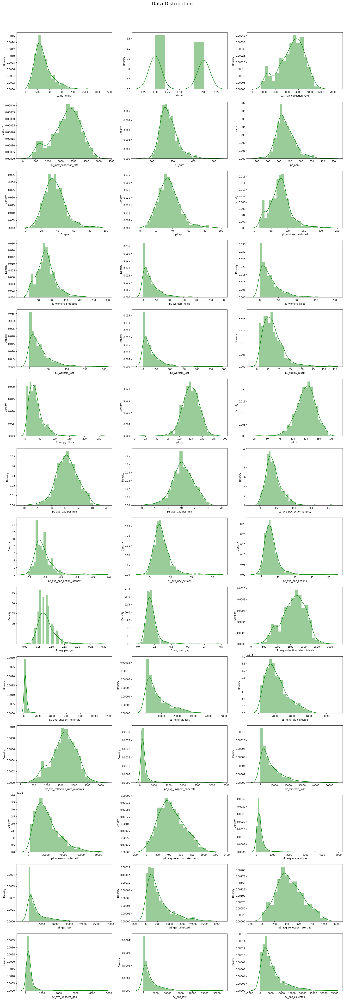

In [170]:
# Distribution of numerical variable
dist_data(train_df,compare=False, max_number=None)

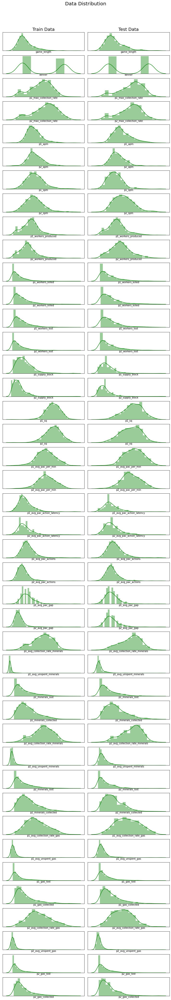

In [171]:
# Compare distribution of numerical variable train and test
dist_data(train_df, test_df, compare=True, max_number=None)

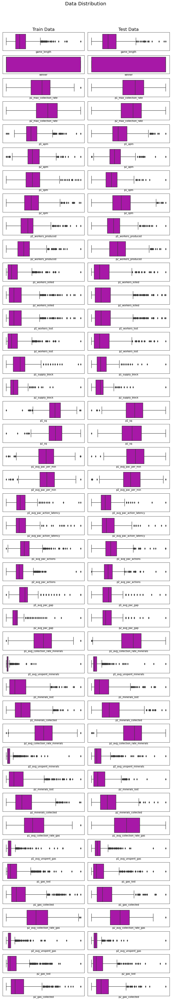

In [172]:
# Compare boxplot of numerical variable train and test
dist_data(train_df, test_df, kind='box', compare=True, max_number=None, color='m')

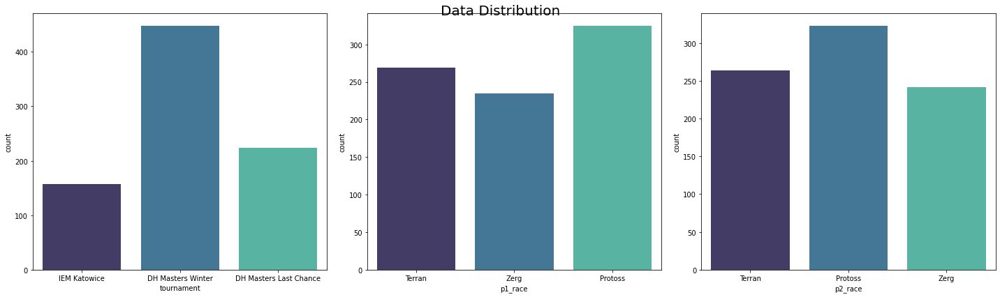

In [173]:
# Distribution of categorical variable
dist_data(train_df, compare=False, dtype='object', max_number=5)

### 4. Correlation between features

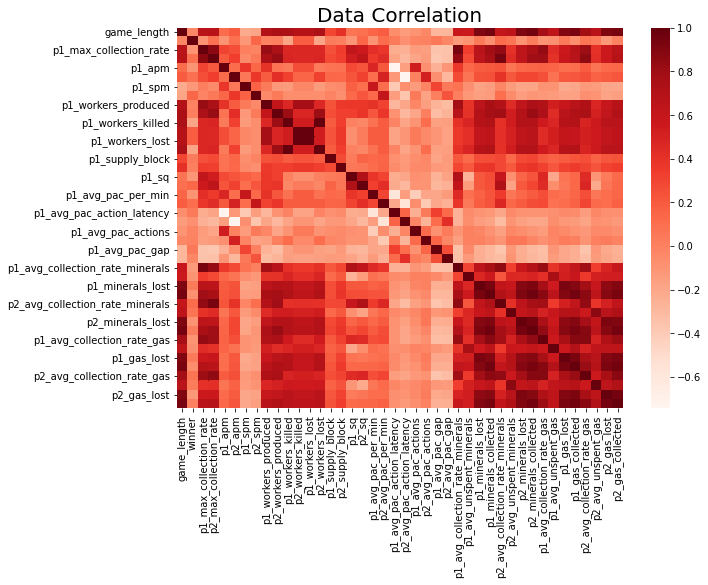

In [174]:
# Correlation between features
plot_correlation(train_df)

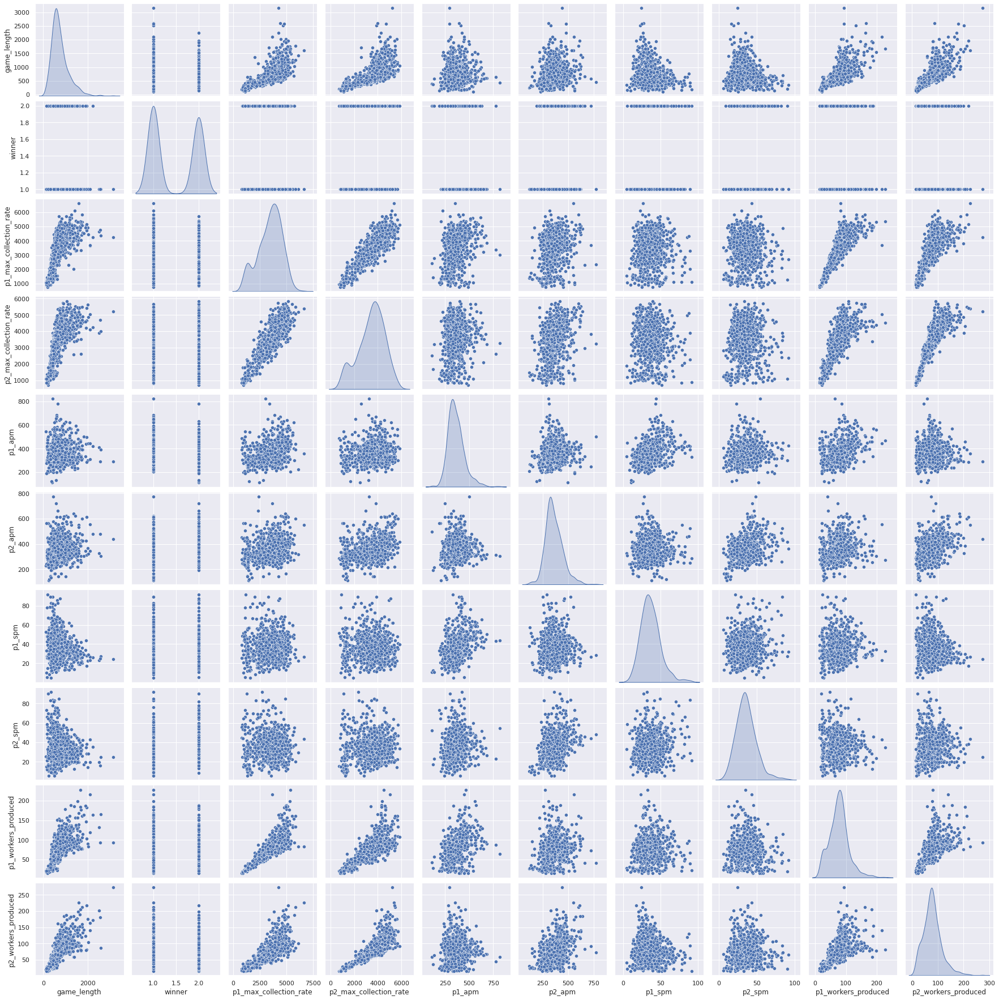

In [175]:
# Pairplot between features
pairplot_data(train_df, 'matchup', number_pair = 10)

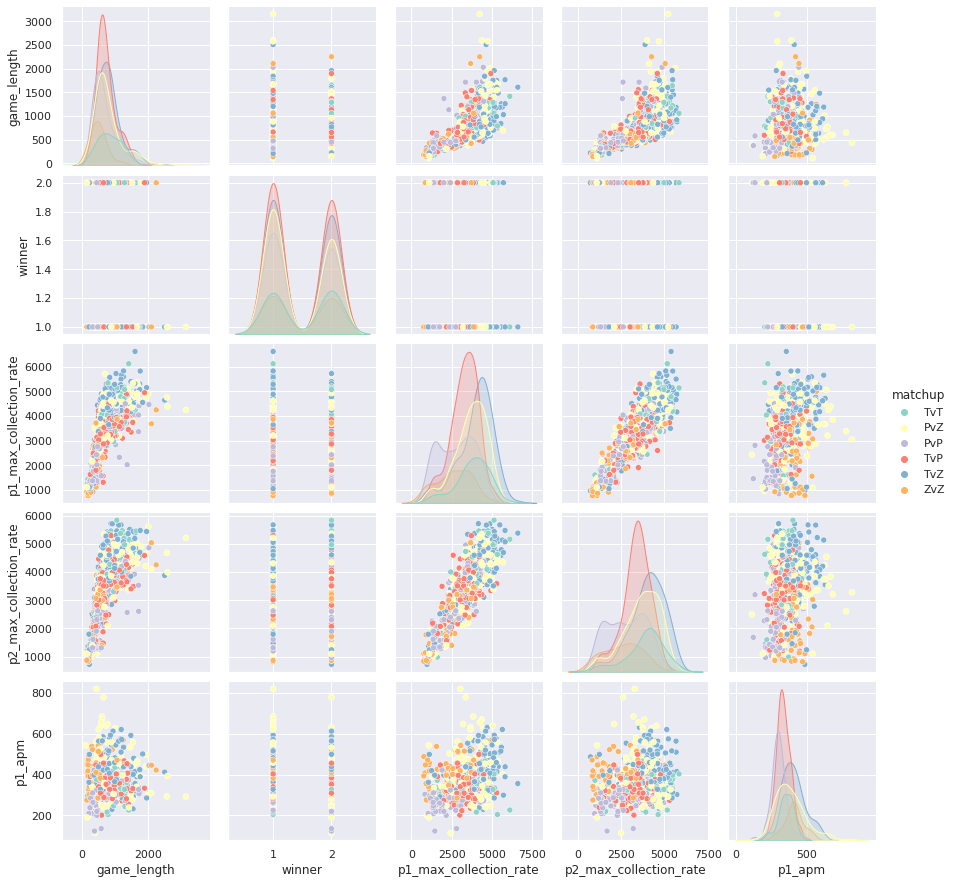

In [176]:
# Pairplot between features on target
pairplot_data(train_df, 'matchup', hue='matchup')

### 5. Correlation between target

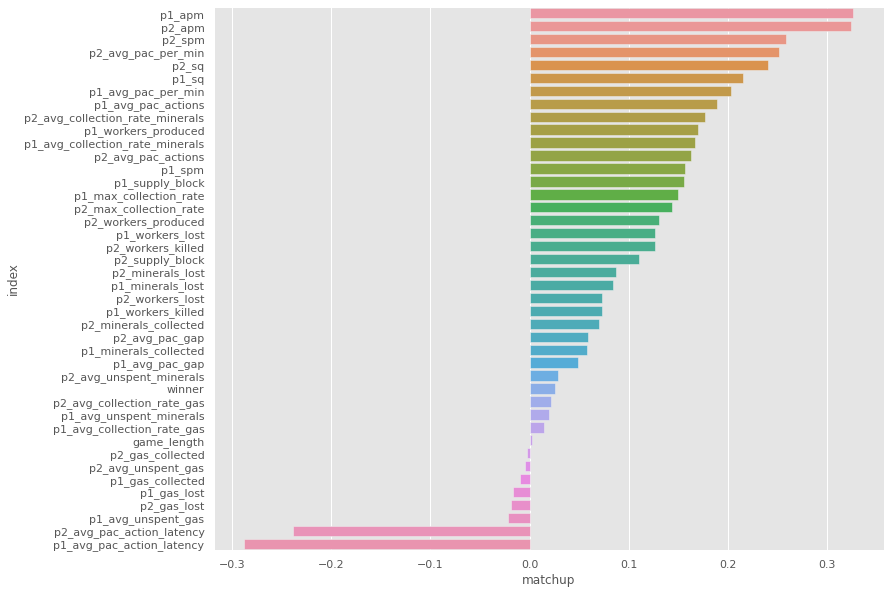

In [177]:
# Correlation with target
temp_df = train_df.copy()
temp_df['matchup'] = target.copy()
corr_target(temp_df, 'matchup')

### 6. Analysis map column

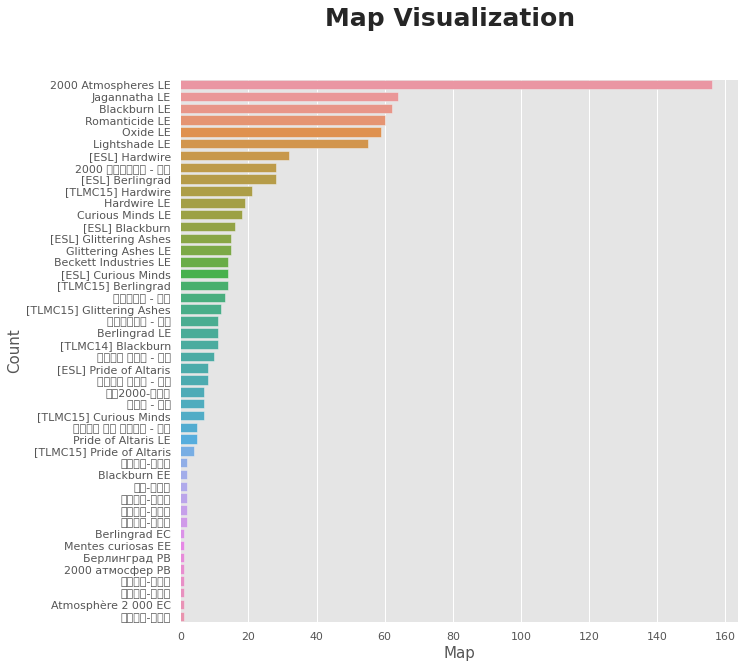

In [178]:
# Plot train data map column
plot_map(train_df)

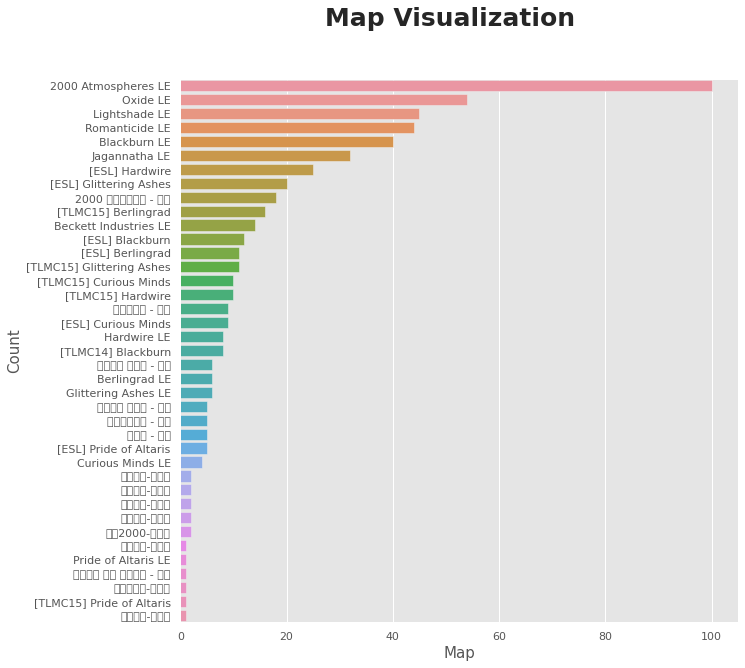

In [179]:
# Plot test data map column
plot_map(test_df)

### 7. Column equality

In [180]:
# Check equality of column
train_df.loc[:,'p1_workers_killed':'p2_workers_lost'].head()

,p1_workers_killed,p2_workers_killed,p1_workers_lost,p2_workers_lost
0,18,17,17,18
1,22,21,21,22
2,11,17,17,11
3,68,30,30,68
4,24,25,25,24


In [181]:
# Both columns equal
print(all(train_df['p1_workers_killed']==train_df['p2_workers_lost']))
print(all(train_df['p1_workers_lost']==train_df['p2_workers_killed']))

True
True


### 8. Race relation with matchup

In [182]:
# Check race relation with matchup
train_df[['matchup','p1_race','p2_race']].head()

,matchup,p1_race,p2_race
0,TvT,Terran,Terran
1,PvZ,Zerg,Protoss
2,PvZ,Zerg,Protoss
3,PvZ,Protoss,Zerg
4,PvZ,Zerg,Protoss


In [183]:
# Matchup is combination of race
race = list(zip(train_df.p1_race.str[0].tolist(), train_df.p2_race.str[0].tolist()))
matchup = train_df.matchup.str.split('v').tolist()
compare = [set(race[x])==set(matchup[x]) for x in range(train_df.shape[0])]
all(compare)

True

### 9. Race relation with features

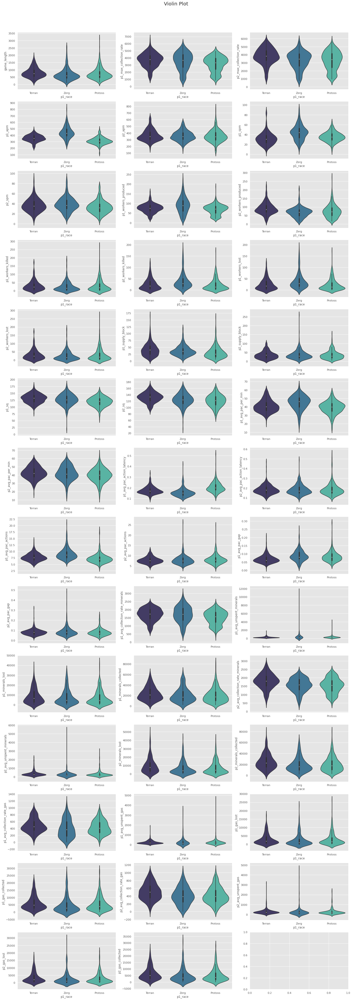

In [184]:
# Numeric features vs p1_race violinplot
cat_vs_num(train_df.drop('winner', axis=1), 'p1_race')

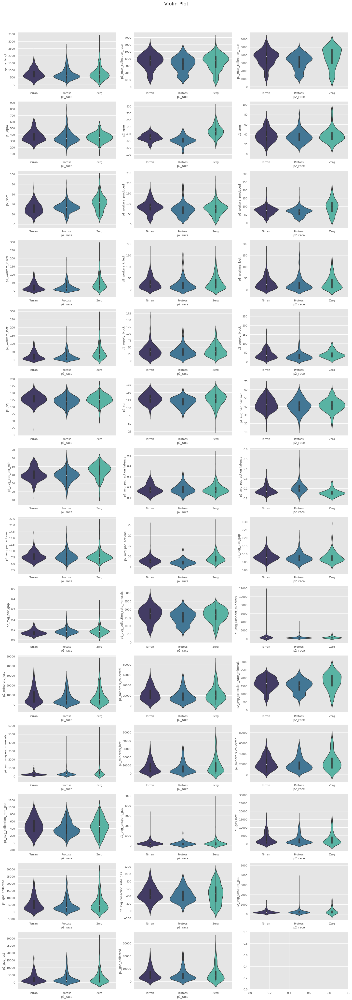

In [185]:
# Numeric features vs p2_race violinplot 
cat_vs_num(train_df.drop('winner', axis=1), 'p2_race')

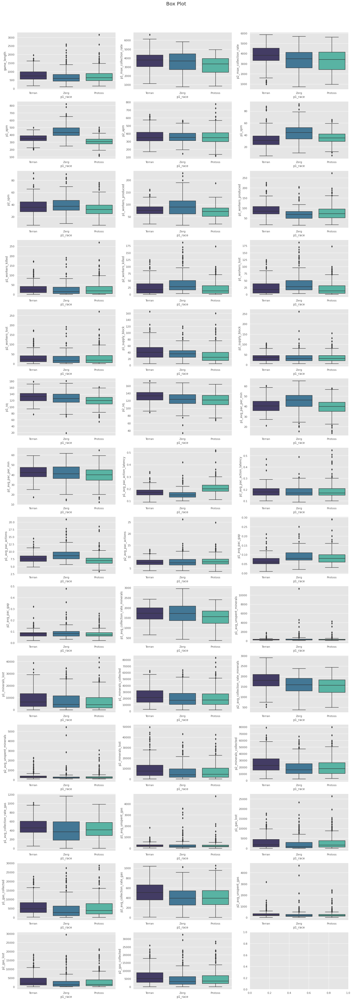

In [186]:
# Numeric features vs p1_race bloxplot
cat_vs_num(train_df.drop('winner', axis=1), 'p1_race', kind='Box')

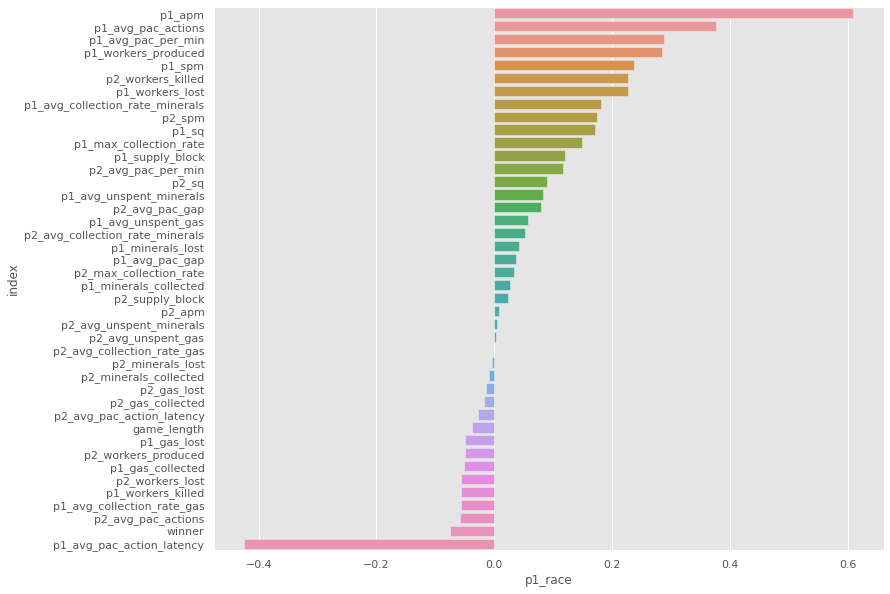

In [187]:
# Features vs p1_race correlation
temp_df = train_df.copy()
temp_df['p1_race'] = temp_df['p1_race'].replace(['Protoss','Terran','Zerg'],[0,1,2])
corr_target(temp_df, 'p1_race')

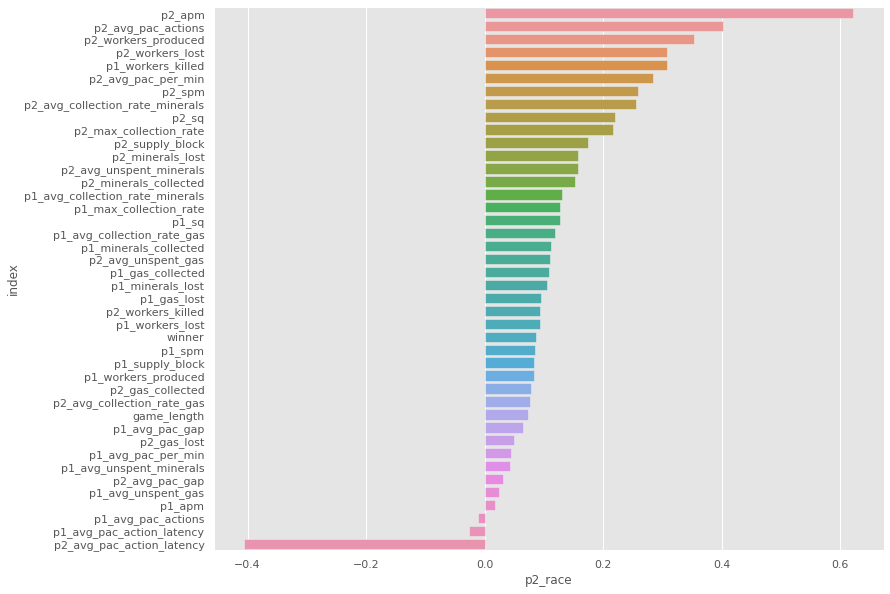

In [188]:
# Features vs p2_race correlation
temp_df = train_df.copy()
temp_df['p2_race'] = temp_df['p2_race'].replace(['Protoss','Terran','Zerg'],[0,1,2])
corr_target(temp_df, 'p2_race')

### 10. Matchup relation with features

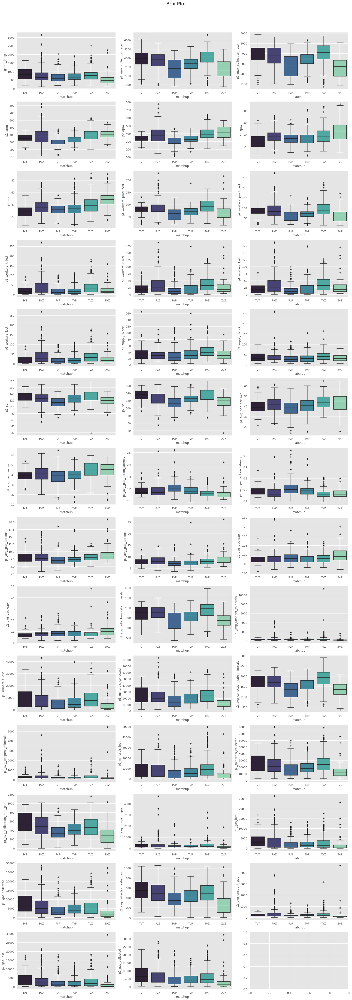

In [189]:
# Features vs mathcup relation
cat_vs_num(train_df.drop('winner', axis=1), 'matchup', kind="Box")

### 11. Tournament relation with features

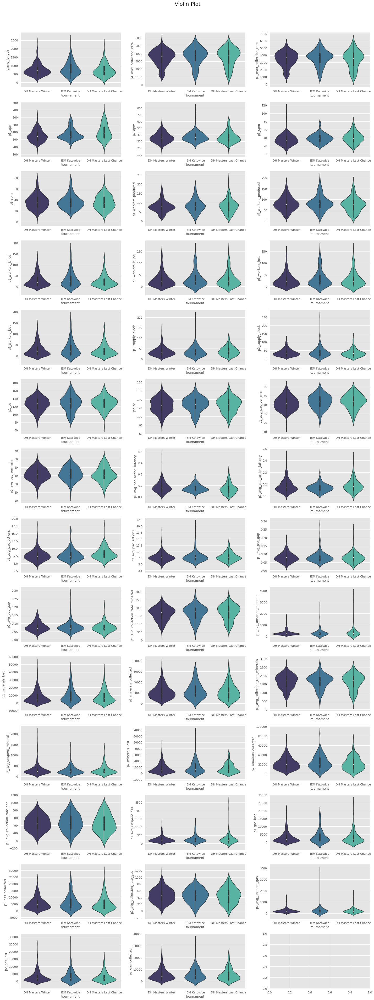

In [190]:
# Tournament vs features relation
cat_vs_num(test_df.drop('winner', axis=1), 'tournament')

In [191]:
# Check correlation between tournament and target
tournaments = temp_df.tournament.replace(list(set(temp_df.tournament)), range(len(set(temp_df.tournament))))
chi_test(tournaments, target, 'tournament', 'matchup')
chi_test(tournaments, temp_df['p1_race'], 'tournament', 'p1_race')
chi_test(tournaments, temp_df['p2_race'], 'tournament', 'p2_race')

P value for tournament and matchup : 6.265804e-03 (significantly correlated)
P value for tournament and p1_race : 2.369169e-03 (significantly correlated)
P value for tournament and p2_race : 3.280734e-02 (significantly correlated)


### 12. Outlier detection

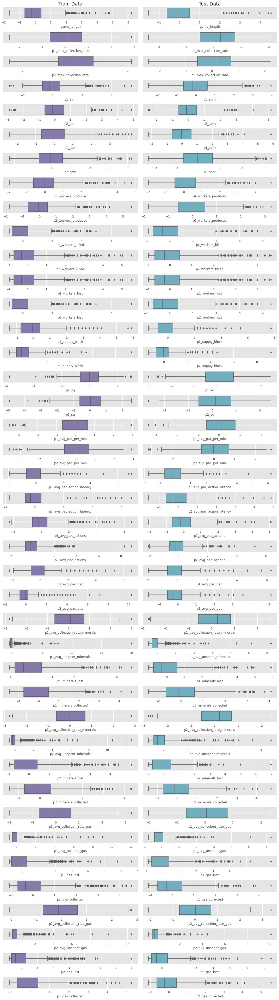

In [192]:
# Compare outlier between train and test
sc= StandardScaler()
compare1 = train_df.drop('winner', axis=1).select_dtypes('number')
compare2 = test_df.drop('winner', axis=1).select_dtypes('number')
sc.fit(compare1)
compare_boxplot(pd.DataFrame(sc.transform(compare1),columns=compare1.columns), pd.DataFrame(sc.transform(compare2),columns=compare2.columns))

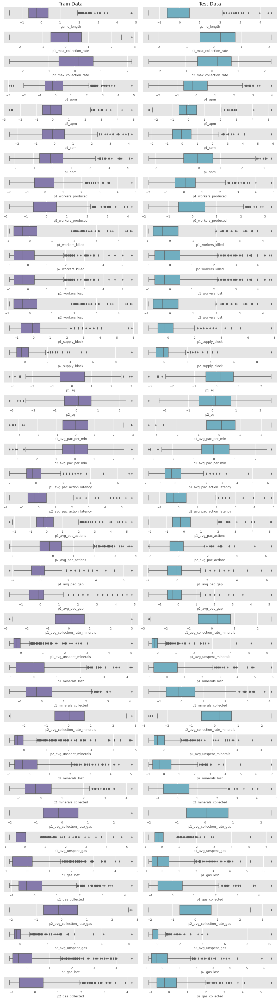

In [193]:
# Remove outlier on train data
remove_outlier(train_df, test_df, compare=True)

### 13. Race Vs Player comparison 

P value for compare_sq and p1_race : 1.833345e-01 (unsignificantly correlated)
P value for compare_sq and p2_race : 7.659367e-02 (unsignificantly correlated)


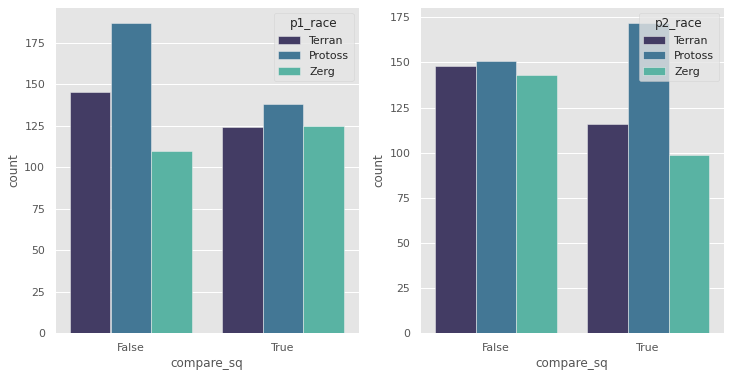

In [194]:
# Compare sq player 1 and 2 with race
temp_df = train_df.copy()
temp_df['compare_sq'] = temp_df['p1_sq'] > temp_df['p2_sq']
chi_test(temp_df['compare_sq'], temp_df['p1_race'], 'compare_sq', 'p1_race')
chi_test(temp_df['compare_sq'], temp_df['p2_race'], 'compare_sq', 'p2_race')
fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('compare_sq', data=temp_df, hue='p1_race', palette='mako', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"])
sns.countplot('compare_sq', data=temp_df, hue='p2_race', palette='mako', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"]);

P value for compare_avg_pac_per_min and p1_race : 1.062560e-04 (significantly correlated)
P value for compare_avg_pac_per_min and p2_race : 6.374262e-05 (significantly correlated)


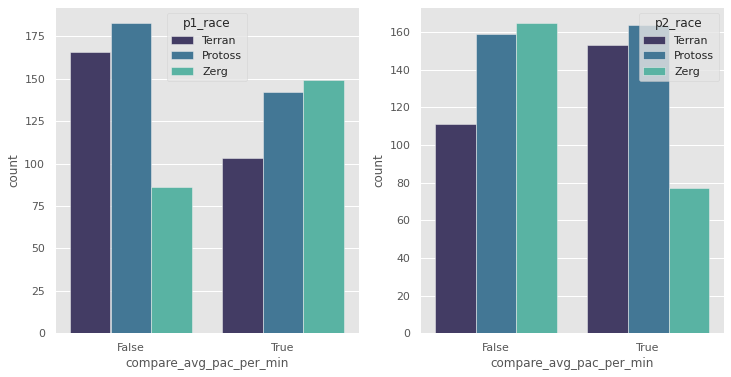

In [195]:
# Compare avg_pac_per_min player 1 and 2 with race
temp_df = train_df.copy()
temp_df['compare_avg_pac_per_min'] = temp_df['p1_avg_pac_per_min'] > temp_df['p2_avg_pac_per_min']
chi_test(temp_df['compare_avg_pac_per_min'], temp_df['p1_race'], 'compare_avg_pac_per_min', 'p1_race')
chi_test(temp_df['compare_avg_pac_per_min'], temp_df['p2_race'], 'compare_avg_pac_per_min', 'p2_race')
fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('compare_avg_pac_per_min', data=temp_df, hue='p1_race', palette='mako', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"])
sns.countplot('compare_avg_pac_per_min', data=temp_df, hue='p2_race', palette='mako', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"]);

P value for compare_avg_pac_action_latency and p1_race : 2.343195e-09 (significantly correlated)
P value for compare_avg_pac_action_latency and p2_race : 8.839265e-08 (significantly correlated)


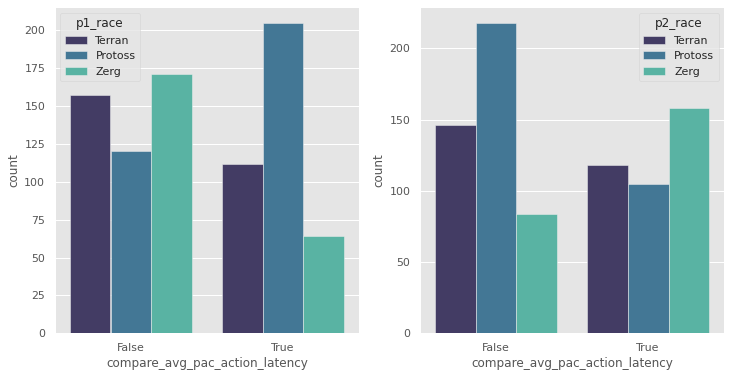

In [196]:
# Compare avg_pac_action_latency player 1 and 2 with race
temp_df = train_df.copy()
temp_df['compare_avg_pac_action_latency'] = temp_df['p1_avg_pac_action_latency'] > temp_df['p2_avg_pac_action_latency']
chi_test(temp_df['compare_avg_pac_action_latency'], temp_df['p1_race'], 'compare_avg_pac_action_latency', 'p1_race')
chi_test(temp_df['compare_avg_pac_action_latency'], temp_df['p2_race'], 'compare_avg_pac_action_latency', 'p2_race')
fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('compare_avg_pac_action_latency', data=temp_df, hue='p1_race', palette='mako', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"])
sns.countplot('compare_avg_pac_action_latency', data=temp_df, hue='p2_race', palette='mako', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"]);

P value for compare_avg_pac_actions and p1_race : 2.792384e-07 (significantly correlated)
P value for compare_avg_pac_actions and p2_race : 4.082923e-08 (significantly correlated)


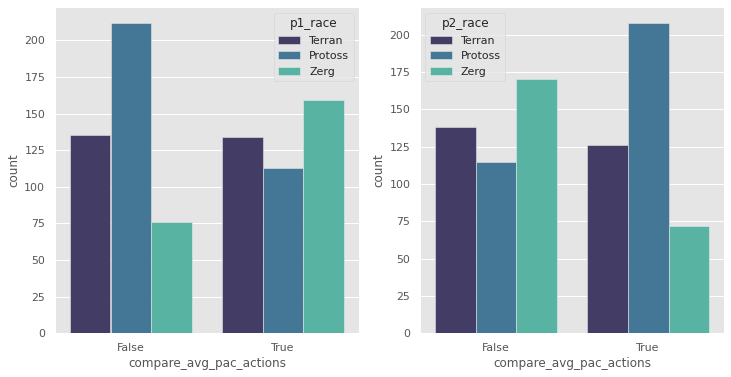

In [197]:
# Compare avg_pac_actions player 1 and 2 with race
temp_df = train_df.copy()
temp_df['compare_avg_pac_actions'] = temp_df['p1_avg_pac_actions'] > temp_df['p2_avg_pac_actions']
chi_test(temp_df['compare_avg_pac_actions'], temp_df['p1_race'], 'compare_avg_pac_actions', 'p1_race')
chi_test(temp_df['compare_avg_pac_actions'], temp_df['p2_race'], 'compare_avg_pac_actions', 'p2_race')
fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('compare_avg_pac_actions', data=temp_df, hue='p1_race', palette='mako', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"])
sns.countplot('compare_avg_pac_actions', data=temp_df, hue='p2_race', palette='mako', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"]);

P value for compare_avg_pac_gap and p1_race : 1.366651e-05 (significantly correlated)
P value for compare_avg_pac_gap and p2_race : 7.923336e-06 (significantly correlated)


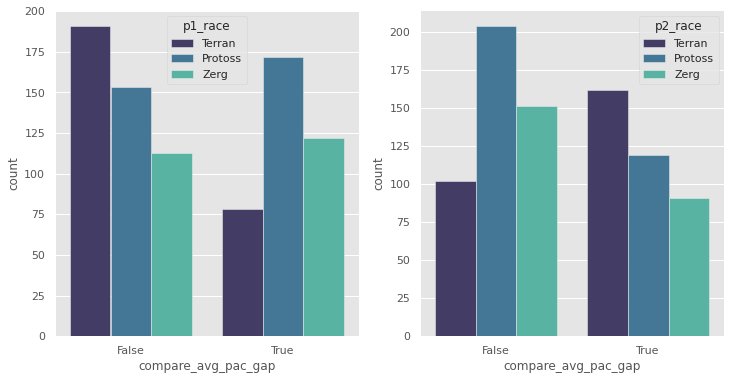

In [198]:
# Compare avg_pac_gap player 1 and 2 with race
temp_df = train_df.copy()
temp_df['compare_avg_pac_gap'] = temp_df['p1_avg_pac_gap'] > temp_df['p2_avg_pac_gap']
chi_test(temp_df['compare_avg_pac_gap'], temp_df['p1_race'], 'compare_avg_pac_gap', 'p1_race')
chi_test(temp_df['compare_avg_pac_gap'], temp_df['p2_race'], 'compare_avg_pac_gap', 'p2_race')
fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('compare_avg_pac_gap', data=temp_df, hue='p1_race', palette='mako', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"])
sns.countplot('compare_avg_pac_gap', data=temp_df, hue='p2_race', palette='mako', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"]);

P value for compare_apm and p1_race : 2.899876e-16 (significantly correlated)
P value for compare_apm and p2_race : 1.649363e-14 (significantly correlated)


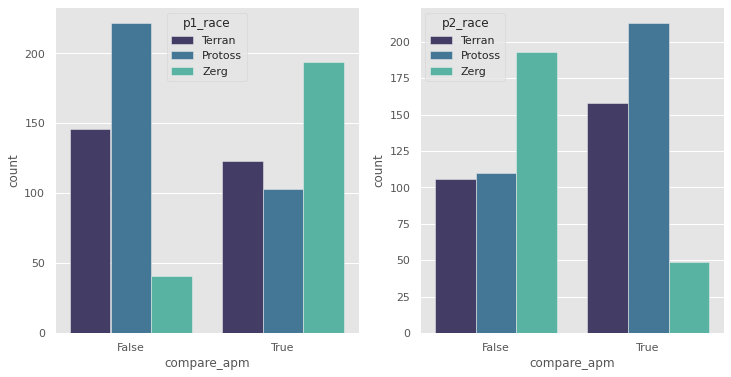

In [199]:
# Compare apm player 1 and 2 with race
temp_df = train_df.copy()
temp_df['compare_apm'] = temp_df['p1_apm'] > temp_df['p2_apm']
chi_test(temp_df['compare_apm'], temp_df['p1_race'], 'compare_apm', 'p1_race')
chi_test(temp_df['compare_apm'], temp_df['p2_race'], 'compare_apm', 'p2_race')
fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('compare_apm', data=temp_df, hue='p1_race', palette='mako', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"])
sns.countplot('compare_apm', data=temp_df, hue='p2_race', palette='mako', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"]);

P value for compare_spm and p1_race : 1.595508e-05 (significantly correlated)
P value for compare_spm and p2_race : 2.826419e-04 (significantly correlated)


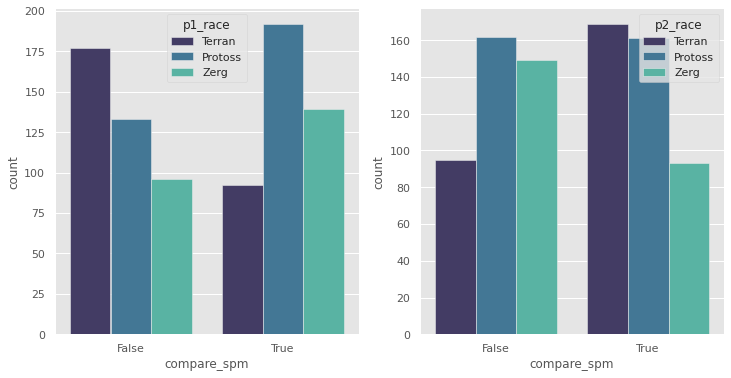

In [200]:
# Compare spm player 1 and 2 with race
temp_df = train_df.copy()
temp_df['compare_spm'] = temp_df['p1_spm'] > temp_df['p2_spm']
chi_test(temp_df['compare_spm'], temp_df['p1_race'], 'compare_spm', 'p1_race')
chi_test(temp_df['compare_spm'], temp_df['p2_race'], 'compare_spm', 'p2_race')
fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('compare_spm', data=temp_df, hue='p1_race', palette='mako', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"])
sns.countplot('compare_spm', data=temp_df, hue='p2_race', palette='mako', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"]);

### 14. Skill VS Race

P value for skill1_avg_pac_per_min and p1_race : 1.813266e-07 (significantly correlated)
P value for skill2_avg_pac_per_min and p2_race : 1.833235e-08 (significantly correlated)


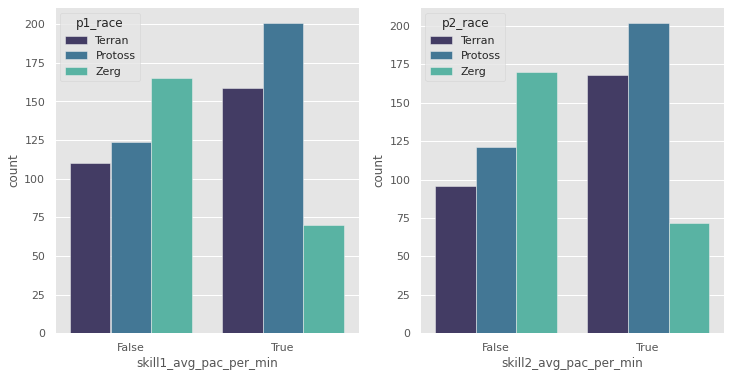

In [201]:
# Compare skill on avg_pac_per_min with race
temp_df = train_df.copy()
temp_df['skill1_avg_pac_per_min'] = temp_df['p1_avg_pac_per_min'] < pd.concat([train_df['p1_avg_pac_per_min'],train_df['p2_avg_pac_per_min'],
                                   test_df['p1_avg_pac_per_min'],test_df['p2_avg_pac_per_min'],], axis=0).mean()
temp_df['skill2_avg_pac_per_min'] = temp_df['p2_avg_pac_per_min'] < pd.concat([train_df['p1_avg_pac_per_min'],train_df['p2_avg_pac_per_min'],
                                   test_df['p1_avg_pac_per_min'],test_df['p2_avg_pac_per_min'],], axis=0).mean()
chi_test(temp_df['skill1_avg_pac_per_min'], temp_df['p1_race'], 'skill1_avg_pac_per_min', 'p1_race')
chi_test(temp_df['skill2_avg_pac_per_min'], temp_df['p2_race'], 'skill2_avg_pac_per_min', 'p2_race')
fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('skill1_avg_pac_per_min', data=temp_df, hue='p1_race', palette='mako', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"])
sns.countplot('skill2_avg_pac_per_min', data=temp_df, hue='p2_race', palette='mako', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"]);

P value for skill1_avg_pac_gap and p1_race : 8.181667e-05 (significantly correlated)
P value for skill2_avg_pac_gap and p2_race : 5.593730e-03 (significantly correlated)


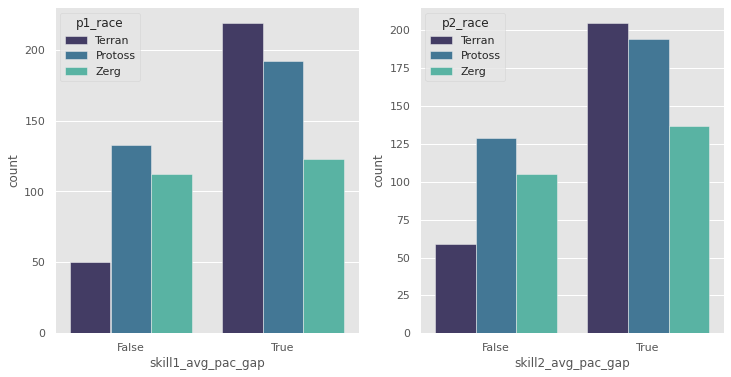

In [202]:
# Compare skill on avg_pac_gap with race
temp_df['skill1_avg_pac_gap'] = temp_df['p1_avg_pac_gap'] < pd.concat([train_df['p1_avg_pac_gap'],train_df['p2_avg_pac_gap'],
                                   test_df['p1_avg_pac_gap'],test_df['p2_avg_pac_gap']], axis=0).mean()
temp_df['skill2_avg_pac_gap'] = temp_df['p2_avg_pac_gap'] < pd.concat([train_df['p1_avg_pac_gap'],train_df['p2_avg_pac_gap'],
                                   test_df['p1_avg_pac_gap'],test_df['p2_avg_pac_gap']], axis=0).mean()
chi_test(temp_df['skill1_avg_pac_gap'], temp_df['p1_race'], 'skill1_avg_pac_gap', 'p1_race')
chi_test(temp_df['skill2_avg_pac_gap'], temp_df['p2_race'], 'skill2_avg_pac_gap', 'p2_race')
fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('skill1_avg_pac_gap', data=temp_df, hue='p1_race', palette='mako', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"])
sns.countplot('skill2_avg_pac_gap', data=temp_df, hue='p2_race', palette='mako', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"]);

P value for skill1_avg_pac_gap and p1_race : 8.181667e-05 (significantly correlated)
P value for skill2_avg_pac_gap and p2_race : 5.593730e-03 (significantly correlated)


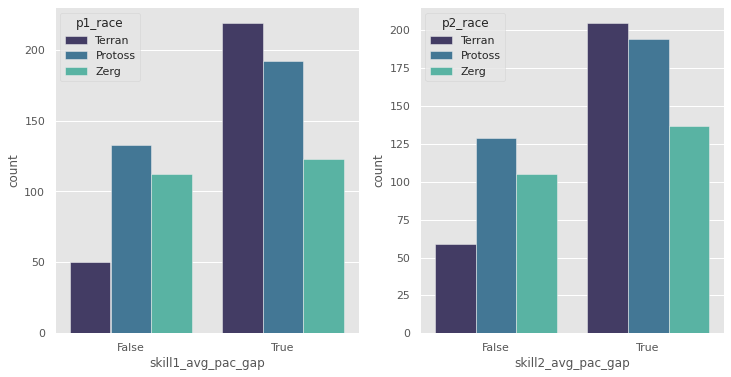

In [203]:
# Compare skill on avg_pac_actions with race
temp_df['skill1_avg_pac_actions'] = temp_df['p1_avg_pac_actions'] < pd.concat([train_df['p1_avg_pac_actions'],train_df['p2_avg_pac_actions'],
                                   test_df['p1_avg_pac_actions'],test_df['p2_avg_pac_actions']], axis=0).mean()
temp_df['skill2_avg_pac_actions'] = temp_df['p2_avg_pac_actions'] < pd.concat([train_df['p1_avg_pac_actions'],train_df['p2_avg_pac_actions'],
                                   test_df['p1_avg_pac_actions'],test_df['p2_avg_pac_actions']], axis=0).mean()
chi_test(temp_df['skill1_avg_pac_gap'], temp_df['p1_race'], 'skill1_avg_pac_gap', 'p1_race')
chi_test(temp_df['skill2_avg_pac_gap'], temp_df['p2_race'], 'skill2_avg_pac_gap', 'p2_race')
fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('skill1_avg_pac_gap', data=temp_df, hue='p1_race', palette='mako', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"])
sns.countplot('skill2_avg_pac_gap', data=temp_df, hue='p2_race', palette='mako', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"]);

P value for skill1_avg_pac_action_latency and p1_race : 3.199442e-13 (significantly correlated)
P value for skill2_avg_pac_action_latency and p2_race : 3.492373e-13 (significantly correlated)


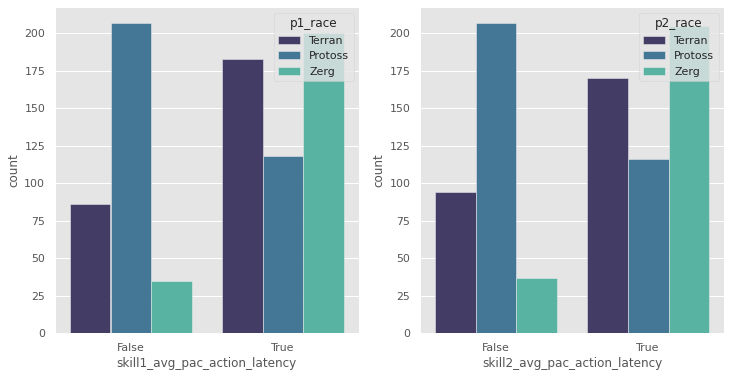

In [204]:
# Compare skill on avg_pac_action_latency with race
temp_df['skill1_avg_pac_action_latency'] = temp_df['p1_avg_pac_action_latency'] < pd.concat([train_df['p1_avg_pac_action_latency'],train_df['p2_avg_pac_action_latency'],
                                   test_df['p1_avg_pac_action_latency'],test_df['p2_avg_pac_action_latency']], axis=0).mean()
temp_df['skill2_avg_pac_action_latency'] = temp_df['p2_avg_pac_action_latency'] < pd.concat([train_df['p1_avg_pac_action_latency'],train_df['p2_avg_pac_action_latency'],
                                   test_df['p1_avg_pac_action_latency'],test_df['p2_avg_pac_action_latency']], axis=0).mean()
chi_test(temp_df['skill1_avg_pac_action_latency'], temp_df['p1_race'], 'skill1_avg_pac_action_latency', 'p1_race')
chi_test(temp_df['skill2_avg_pac_action_latency'], temp_df['p2_race'], 'skill2_avg_pac_action_latency', 'p2_race')
fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('skill1_avg_pac_action_latency', data=temp_df, hue='p1_race', palette='mako', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"])
sns.countplot('skill2_avg_pac_action_latency', data=temp_df, hue='p2_race', palette='mako', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"]);

P value for skill1_sq and p1_race : 1.704458e-05 (significantly correlated)
P value for skill2_sq and p2_race : 6.735903e-04 (significantly correlated)


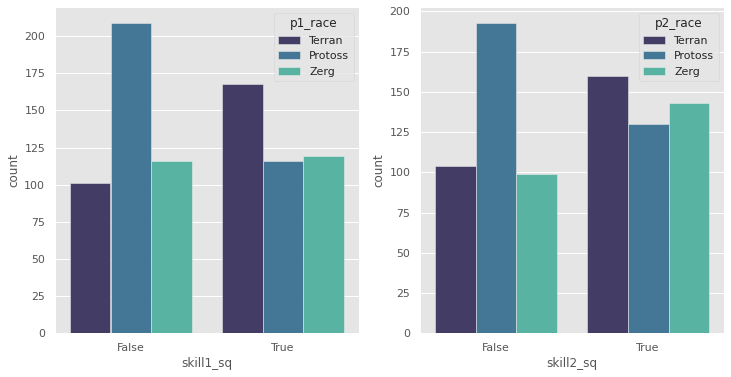

In [205]:
# Compare skill on sq with race
temp_df['skill1_sq'] = temp_df['p1_sq'] > pd.concat([train_df['p1_sq'],train_df['p2_sq'],
                                   test_df['p1_sq'],test_df['p2_sq']], axis=0).mean()
temp_df['skill2_sq'] = temp_df['p2_sq'] > pd.concat([train_df['p1_sq'],train_df['p2_sq'],
                                   test_df['p1_sq'],test_df['p2_sq']], axis=0).mean()
chi_test(temp_df['skill1_sq'], temp_df['p1_race'], 'skill1_sq', 'p1_race')
chi_test(temp_df['skill2_sq'], temp_df['p2_race'], 'skill2_sq', 'p2_race')
fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('skill1_sq', data=temp_df, hue='p1_race', palette='mako', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"])
sns.countplot('skill2_sq', data=temp_df, hue='p2_race', palette='mako', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"]);            

P value for skill1_apm and p1_race : 9.907608e-33 (significantly correlated)
P value for skill2_apm and p2_race : 7.875395e-32 (significantly correlated)


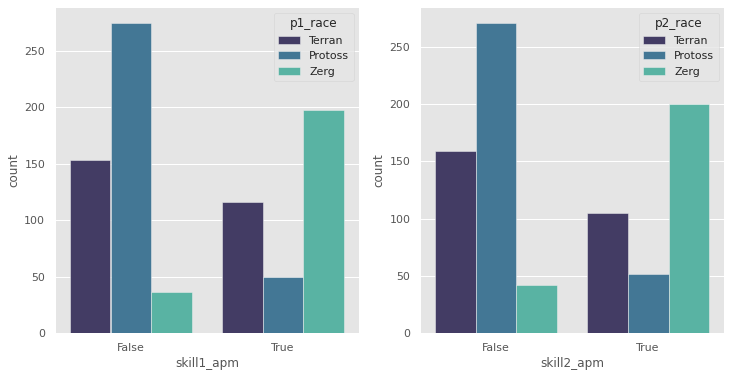

In [206]:
# Compare skill on apm with race
temp_df['skill1_apm'] = temp_df['p1_apm'] > pd.concat([train_df['p1_apm'],train_df['p2_apm'],
                                   test_df['p1_apm'],test_df['p2_apm']], axis=0).mean()
temp_df['skill2_apm'] = temp_df['p2_apm'] > pd.concat([train_df['p1_apm'],train_df['p2_apm'],
                                   test_df['p1_apm'],test_df['p2_apm']], axis=0).mean()
chi_test(temp_df['skill1_apm'], temp_df['p1_race'], 'skill1_apm', 'p1_race')
chi_test(temp_df['skill2_apm'], temp_df['p2_race'], 'skill2_apm', 'p2_race')
fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('skill1_apm', data=temp_df, hue='p1_race', palette='mako', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"])
sns.countplot('skill2_apm', data=temp_df, hue='p2_race', palette='mako', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"]);

P value for skill1_spm and p1_race : 5.208429e-10 (significantly correlated)
P value for skill2_spm and p2_race : 1.063535e-09 (significantly correlated)


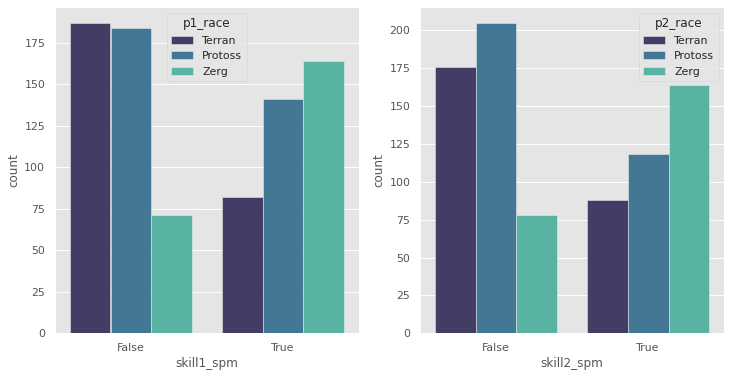

In [207]:
# Compare skill on spm with race
temp_df['skill1_spm'] = temp_df['p1_spm'] > pd.concat([train_df['p1_spm'],train_df['p2_spm'],
                                   test_df['p1_spm'],test_df['p2_spm']], axis=0).mean()
temp_df['skill2_spm'] = temp_df['p2_spm'] > pd.concat([train_df['p1_spm'],train_df['p2_spm'],
                                   test_df['p1_spm'],test_df['p2_spm']], axis=0).mean()
chi_test(temp_df['skill1_spm'], temp_df['p1_race'], 'skill1_spm', 'p1_race')
chi_test(temp_df['skill2_spm'], temp_df['p2_race'], 'skill2_spm', 'p2_race')
fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('skill1_spm', data=temp_df, hue='p1_race', palette='mako', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"])
sns.countplot('skill2_spm', data=temp_df, hue='p2_race', palette='mako', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"]);

### 15. Stacked features vs Race

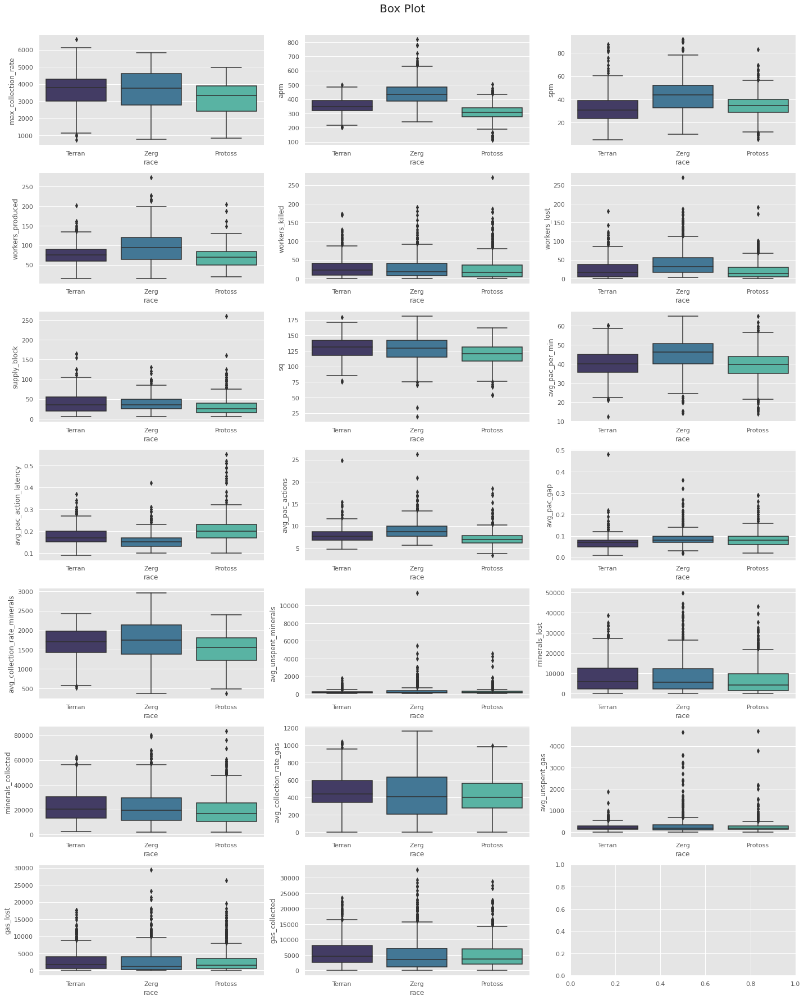

In [208]:
# Find defining traits for race
temp_df = train_df.copy()
p1_list = [x for x in temp_df.columns if x.startswith('p1_')]
p2_list = [x for x in temp_df.columns if x.startswith('p2_')]
stack_df = pd.concat([temp_df[p1_list].rename(columns = dict(zip(p1_list, p2_list))), 
           temp_df[p2_list]], axis=0)
stack_df.rename(columns=dict(zip(p2_list,[x[3:] for x in p2_list])), inplace=True)
cat_vs_num(stack_df, 'race', kind='Box')

## Feature Engineer

### Map column

In [209]:
print(set(train_df.map) | set(test_df.map))

{'贝克特工业-天梯版', 'Берлинград РВ', 'Glittering Ashes LE', '블랙번 - 래더', 'Blackburn LE', '[TLMC15] Glittering Ashes', '黑色燃烧-天梯版', 'Oxide LE', '하드와이어 - 래더', '큐리어스 마인즈 - 래더', '[TLMC14] Blackburn', '[ESL] Curious Minds', '베를린그라드 - 래더', '2000 애트모스피어 - 래더', '[ESL] Berlingrad', '[TLMC15] Pride of Altaris', 'Atmosphère 2\xa0000 EC', '[ESL] Hardwire', 'Blackburn EE', '紫晶浪漫-天梯版', 'Lightshade LE', '[ESL] Pride of Altaris', 'Berlingrad LE', '柏林加德-天梯版', '[TLMC15] Hardwire', 'Hardwire LE', '2000 Atmospheres LE', '[ESL] Blackburn', 'Jagannatha LE', '[TLMC15] Berlingrad', '[TLMC15] Curious Minds', '闪烬平原-天梯版', '锈化山巅-天梯版', 'Mentes curiosas EE', 'Romanticide LE', '世界主宰-天梯版', 'Pride of Altaris LE', '硬线-天梯版', 'Beckett Industries LE', '大气2000-天梯版', 'Curious Minds LE', '新奇之地-天梯版', '2000 атмосфер РВ', '光影交错-天梯版', 'Berlingrad EC', '글리터링 애쉬즈 - 래더', '프라이드 오브 알타리스 - 래더', '[ESL] Glittering Ashes'}


In [210]:
temp_df = FE_map(train_df)

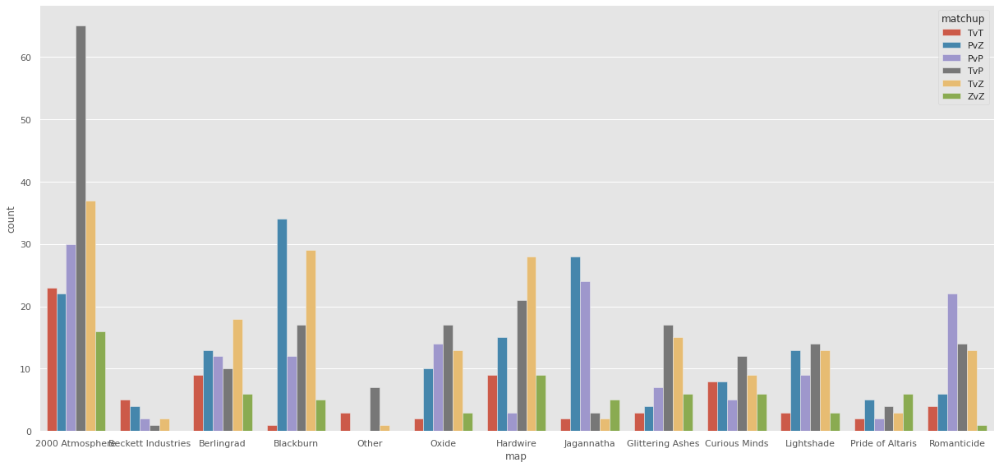

In [211]:
# Relation Map vs Matchup
plt.figure(figsize=(17,8))
sns.countplot('map',data=temp_df, hue='matchup')
plt.tight_layout()

In [212]:
maps = temp_df.map.replace(list(set(temp_df.map)), range(len(set(temp_df.map))))
chi_test(maps, target, 'map', 'matchup')

P value for map and matchup : 1.389822e-09 (significantly correlated)


### Played at column

P value for year and p1_race : 9.986028e-01 (unsignificantly correlated)
P value for year and p2_race : 9.990360e-01 (unsignificantly correlated)


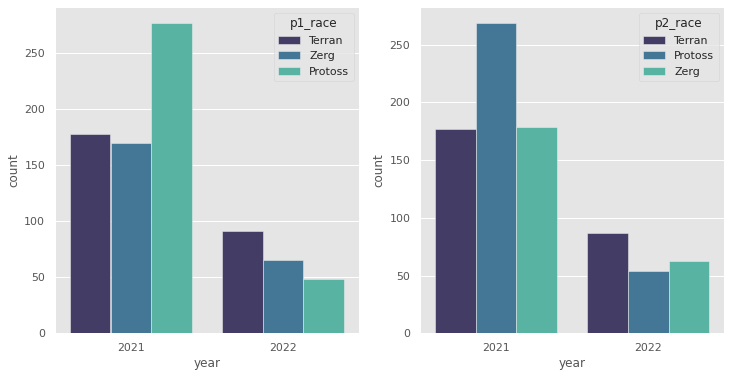

In [ ]:
# Relation race with year columns
temp_df = FE_date(train_df)
fig,ax = plt.subplots(1,2, figsize=(12,6))
chi_test(temp_df['year'], temp_df['p1_race'], 'year', 'p1_race')
chi_test(temp_df['year'], temp_df['p2_race'], 'year', 'p2_race')
sns.countplot('year', data=temp_df, hue='p1_race', palette='mako', ax=ax[0])
sns.countplot('year', data=temp_df, hue='p2_race', palette='mako', ax=ax[1]);

### Comparison player column

In [ ]:
temp_df = FE_compare_player(train_df)

In [ ]:
temp_df.head().iloc[:,-9:]

,p1_race,p2_race,compare_avg_pac_per_min,compare_avg_pac_gap,compare_avg_pac_actions,compare_avg_pac_action_latency,compare_sq,compare_apm,compare_spm
0,Terran,Terran,False,False,False,True,False,False,False
1,Zerg,Protoss,True,False,False,False,True,True,True
2,Zerg,Protoss,False,False,True,False,False,True,False
3,Protoss,Zerg,False,False,True,True,True,False,False
4,Zerg,Protoss,True,False,True,False,True,True,True


P value for player and p1_race : 7.894144e-10 (significantly correlated)


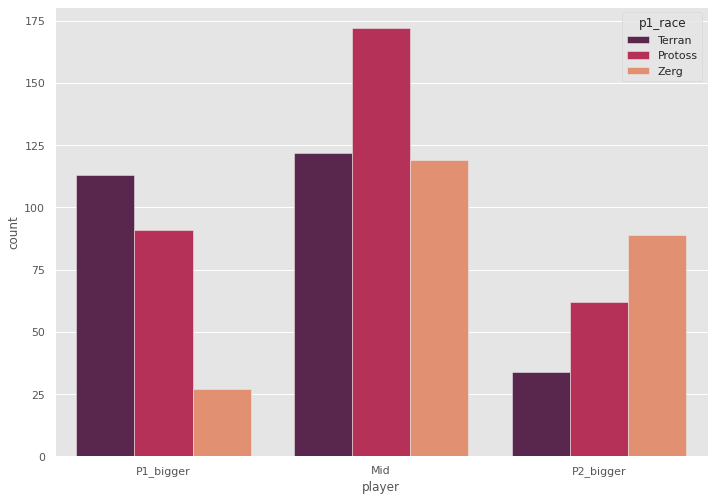

In [ ]:
# Compare features on player 1 and 2
temp_df = FE_player(temp_df)

chi_test(temp_df['player'].replace(['P1_bigger',"Mid","P2_bigger"],[0,1,2]), temp_df['p1_race'], 'player', 'p1_race')

sns.countplot('player', data=temp_df, hue='p1_race', palette='rocket', 
              hue_order=['Terran','Protoss',"Zerg"], order=['P1_bigger',"Mid","P2_bigger"]);

### Level column

In [ ]:
temp_df = FE_compare_skill(train_df, test_df)

In [ ]:
temp_df.head().iloc[:,-16:]

,p1_race,p2_race,skill1_avg_pac_per_min,skill1_avg_pac_gap,skill1_avg_pac_actions,skill1_avg_pac_action_latency,skill1_sq,skill1_apm,skill1_spm,skill2_avg_pac_per_min,skill2_avg_pac_gap,skill2_avg_pac_actions,skill2_avg_pac_action_latency,skill2_sq,skill2_apm,skill2_spm
0,Terran,Terran,True,True,False,False,True,False,False,True,False,False,True,True,True,True
1,Zerg,Protoss,False,True,True,True,True,True,True,True,True,False,False,False,False,False
2,Zerg,Protoss,True,True,False,True,False,True,False,True,True,True,False,False,False,True
3,Protoss,Zerg,False,True,False,True,True,True,True,False,False,False,True,False,True,True
4,Zerg,Protoss,False,True,False,True,True,True,True,False,False,True,False,True,False,False


P value for level1 and p1_race : 1.452417e-06 (significantly correlated)
P value for level2 and p2_race : 1.577555e-06 (significantly correlated)


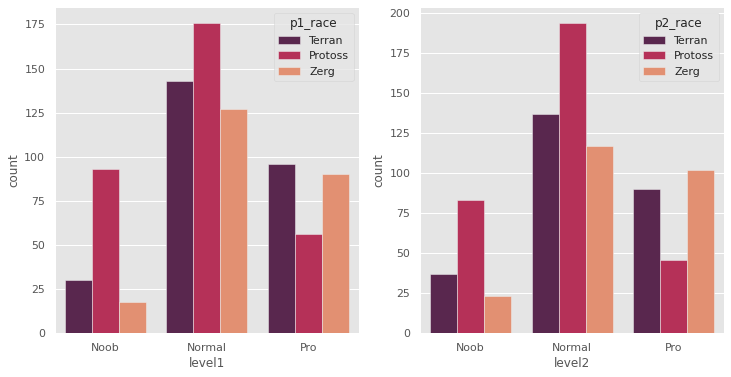

In [ ]:
# Compare player level
temp_df = FE_level(temp_df)

chi_test(temp_df['level1'].replace(['Noob',"Normal","Pro"],[0,1,2]), temp_df['p1_race'], 'level1', 'p1_race')
chi_test(temp_df['level2'].replace(['Noob',"Normal","Pro"],[0,1,2]), temp_df['p2_race'], 'level2', 'p2_race')

fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('level1', data=temp_df, hue='p1_race', palette='rocket', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"], order=['Noob',"Normal","Pro"])
sns.countplot('level2', data=temp_df, hue='p2_race', palette='rocket', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"], order=['Noob',"Normal","Pro"]);

### Type column

In [214]:
temp_df = FE_map(train_df)
temp_df = FE_game_type(temp_df)

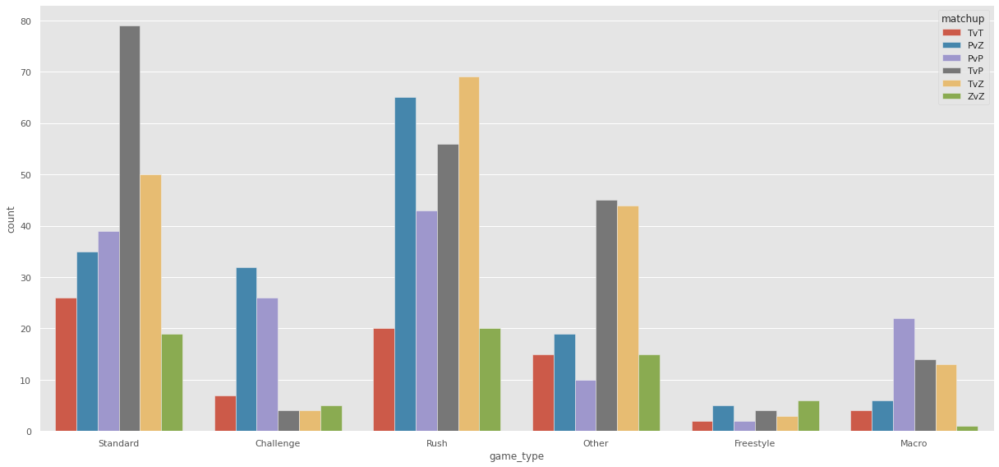

In [215]:
# Plot game type vs target
plt.figure(figsize=(17,8))
sns.countplot('game_type',data=temp_df, hue='matchup')
plt.tight_layout()

In [218]:
# Relation between game type and matchup
game_types = temp_df.game_type.replace(list(set(temp_df.game_type)), range(len(set(temp_df.game_type))))
chi_test(game_types, target, 'game_type', 'matchup')

P value for game_type and matchup : 2.610702e-03 (significantly correlated)


### Apm column

In [ ]:
temp_df = FE_apm(train_df, train_df)

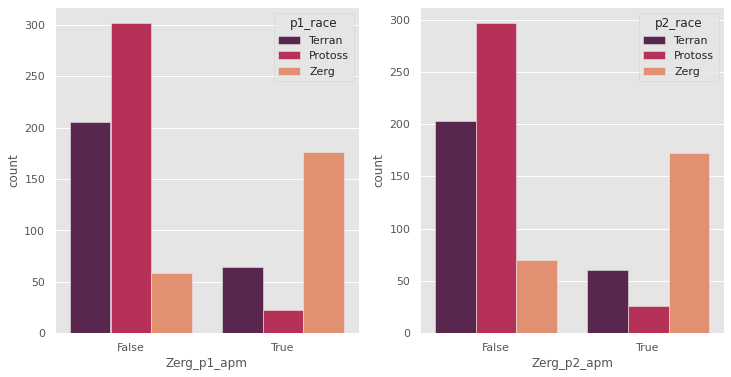

In [ ]:
# Compare unique zerg apm with race
fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('Zerg_p1_apm', data=temp_df, hue='p1_race', palette='rocket', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"])
sns.countplot('Zerg_p2_apm', data=temp_df, hue='p2_race', palette='rocket', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"]);

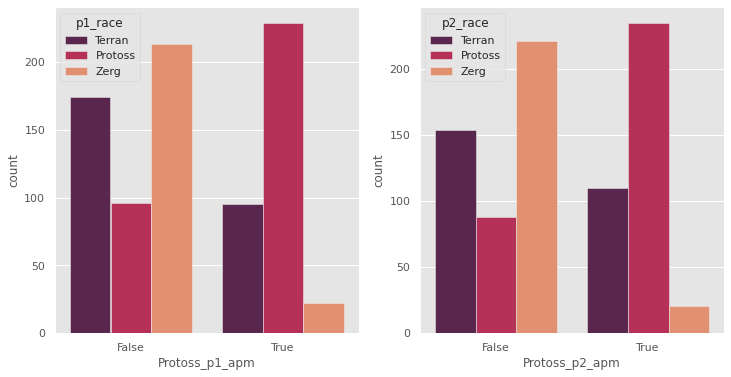

In [ ]:
# Compare unique protoss apm with race
fig,ax = plt.subplots(1,2, figsize=(12,6))
sns.countplot('Protoss_p1_apm', data=temp_df, hue='p1_race', palette='rocket', ax=ax[0], hue_order=['Terran','Protoss',"Zerg"])
sns.countplot('Protoss_p2_apm', data=temp_df, hue='p2_race', palette='rocket', ax=ax[1], hue_order=['Terran','Protoss',"Zerg"]);

In [ ]:
chi_test(temp_df['Zerg_p1_apm'], temp_df['p1_race'], 'Zerg_p1_apm', 'p1_race')
chi_test(temp_df['Zerg_p2_apm'], temp_df['p2_race'], 'Zerg_p2_apm', 'p2_race')
chi_test(temp_df['Protoss_p1_apm'], temp_df['p1_race'], 'Protoss_p1_apm', 'p1_race')
chi_test(temp_df['Protoss_p2_apm'], temp_df['p2_race'], 'Protoss_p1_apm', 'p2_race')

P value for Zerg_p1_apm and p1_race : 2.247910e-45 (significantly correlated)
P value for Zerg_p2_apm and p2_race : 1.054575e-40 (significantly correlated)
P value for Protoss_p1_apm and p1_race : 4.530580e-28 (significantly correlated)
P value for Protoss_p1_apm and p2_race : 8.780293e-29 (significantly correlated)


### SQ Columns

In [ ]:
def FE_sq(data):
  temp_df = data.copy()
  temp_df['p1_sq_minerals'] = 35*(0.00137*temp_df['p1_avg_collection_rate_minerals']
                               -np.log(temp_df['p1_avg_unspent_minerals'])) + 240
  temp_df['p2_sq_minerals'] = 35*(0.00137*temp_df['p2_avg_collection_rate_minerals']
                                -np.log(temp_df['p2_avg_unspent_minerals'])) + 240 
  return temp_df

In [ ]:
temp_df = train_df.copy()

temp_df['p1_sq_minerals'] = 35*(0.00137*temp_df['p1_avg_collection_rate_minerals']
                               -np.log(temp_df['p1_avg_unspent_minerals'])) + 240
temp_df['p2_sq_minerals'] = 35*(0.00137*temp_df['p2_avg_collection_rate_minerals']
                               -np.log(temp_df['p2_avg_unspent_minerals'])) + 240
temp_df['p1_sq_gas'] = 35*(0.00137*temp_df['p2_avg_collection_rate_gas']
                               -np.log(temp_df['p2_avg_unspent_gas'])) + 240 
temp_df['p2_sq_gas'] = 35*(0.00137*temp_df['p2_avg_collection_rate_gas']
                               -np.log(temp_df['p2_avg_unspent_gas'])) + 240  

temp_df['p1_race'] = temp_df['p1_race'].replace(['Protoss','Terran','Zerg'],[0,1,2])
temp_df['p2_race'] = temp_df['p2_race'].replace(['Protoss','Terran','Zerg'],[0,1,2])
temp_df[['p1_sq_minerals','p2_sq_minerals',
         'p1_sq_gas','p2_sq_gas',
         'p1_race','p2_race']].corr()  

,p1_sq_minerals,p2_sq_minerals,p1_sq_gas,p2_sq_gas,p1_race,p2_race
p1_sq_minerals,1.000000,0.636850,0.182846,0.182846,0.161044,0.049877
p2_sq_minerals,0.636850,1.000000,0.215784,0.215784,0.068011,0.144096
p1_sq_gas,0.182846,0.215784,1.000000,1.000000,0.032133,0.001754
p2_sq_gas,0.182846,0.215784,1.000000,1.000000,0.032133,0.001754
p1_race,0.161044,0.068011,0.032133,0.032133,1.000000,0.067202
p2_race,0.049877,0.144096,0.001754,0.001754,0.067202,1.000000


## Main1

This pipeline is to predict the target of matchup

In [80]:
temp_train = train_df.copy()
temp_test = test_df.copy()

# Drop columns
temp_train = drop_data(temp_train, ['id','played_at','p1_race','p2_race','matchup',
                                    'p1_workers_killed','p2_workers_killed'])
temp_test = drop_data(temp_test, ['id','played_at','p1_workers_killed','p2_workers_killed'])

# Remove outlier
temp_train, idx = remove_outlier(temp_train, temp_test)
temp_target = target.drop(idx)

# Feature engineer in map columns
temp_train = FE_map(temp_train)
temp_test = FE_map(temp_test)

# Feature engineer in game type columns
temp_train = FE_game_type(temp_train)
temp_test = FE_game_type(temp_test)

# Feature engineer in apm columns
temp_train = FE_apm(temp_train, pd.concat([temp_train, train_df[['p1_race','p2_race']].drop(idx)], axis=1))
temp_test = FE_apm(temp_test, pd.concat([temp_train, train_df[['p1_race','p2_race']].drop(idx)], axis=1))

# Encode categorical data
temp_test = encode_data(temp_test, temp_train, ordinal=['winner','map'], onehot=['tournament','game_type'])
temp_train = encode_data(temp_train, temp_train, ordinal=['winner','map'], onehot=['tournament','game_type'])

# Standard scaled data
temp_test = scale_data(temp_test, temp_train, exclude=
                      #  [f'map_{x}' for x in range(1,13)]+
                       ['tournament_1', 'tournament_2', 'winner']+
                       ['Zerg_p1_apm','Zerg_p2_apm','Protoss_p1_apm','Protoss_p2_apm']+
                       [f'game_type_{x}' for x in range(1,6)])
temp_train = scale_data(temp_train, temp_train, exclude=
                        # [f'map_{x}' for x in range(1,13)]+
                       ['tournament_1', 'tournament_2', 'winner']+
                       ['Zerg_p1_apm','Zerg_p2_apm','Protoss_p1_apm','Protoss_p2_apm']+
                       [f'game_type_{x}' for x in range(1,6)])

# Change type to float
temp_train = temp_train.astype('float64')
temp_test = temp_test.astype('float64')

# Drop tournament columns
temp_train = drop_data(temp_train, ['tournament_1', 'tournament_2'])
temp_test = drop_data(temp_test, ['tournament_1', 'tournament_2'])

In [81]:
data_train, data_val, target_train, target_val = split_data(temp_train, temp_target, size=0.15)

data_train shape: (688, 50)
data_val shape: (122, 50)


In [ ]:
# Evaluate score
pred = predict_data(CatBoostClassifier(silent=True), data_train, target_train, data_val, target_val, score=False)
f1_score(pred, target_val, average='macro')

0.6606129195751836

In [ ]:
# Predict data
result = predict_data(CatBoostClassifier(silent=True), temp_train, temp_target, temp_test, score=False)

## Main2

This pipeline is to predict P1 and P2 race , then combined it (uses p1 columns to predict p1 race , and p2 to predict p2 race)

In [ ]:
# Create target for p1 and p2 race
target1 = train_df.p1_race.replace(['Protoss','Terran','Zerg'],[0,1,2])
target2 = train_df.p2_race.replace(['Protoss','Terran','Zerg'],[0,1,2])

temp_train = train_df.copy()
temp_test = test_df.copy()

# Drop columns
temp_train = drop_data(temp_train, ['id','played_at','p1_race','p2_race','matchup',
                                    'p1_workers_killed','p2_workers_killed'])
temp_test = drop_data(temp_test, ['id','played_at','p1_workers_killed','p2_workers_killed'])

# Remove outlier
temp_train, idx = remove_outlier(temp_train, temp_test)
temp_target = target.drop(idx)
target1 = target1.drop(idx)
target2 = target2.drop(idx)

# Feature engineer in map columns
temp_train = FE_map(temp_train)
temp_test = FE_map(temp_test)

# Feature engineer in game type columns
temp_train = FE_game_type(temp_train)
temp_test = FE_game_type(temp_test)

# Feature engineer in apm columns
temp_train = FE_apm(temp_train, pd.concat([temp_train, train_df[['p1_race','p2_race']].drop(idx)], axis=1))
temp_test = FE_apm(temp_test, pd.concat([temp_train, train_df[['p1_race','p2_race']].drop(idx)], axis=1))

# Encode categorical data
temp_test = encode_data(temp_test, temp_train, ordinal=['winner'], onehot=['tournament', 'map','game_type'])
temp_train = encode_data(temp_train, temp_train, ordinal=['winner'], onehot=['tournament', 'map','game_type'])

# Standard scaled data
temp_test = scale_data(temp_test, temp_train, exclude=[f'map_{x}' for x in range(1,13)]+
                       ['tournament_1', 'tournament_2', 'winner']+
                       ['Zerg_p1_apm','Zerg_p2_apm','Protoss_p1_apm','Protoss_p2_apm']+
                       [f'game_type_{x}' for x in range(1,6)])
temp_train = scale_data(temp_train, temp_train, exclude=[f'map_{x}' for x in range(1,13)]+
                       ['tournament_1', 'tournament_2', 'winner']+
                       ['Zerg_p1_apm','Zerg_p2_apm','Protoss_p1_apm','Protoss_p2_apm']+
                       [f'game_type_{x}' for x in range(1,6)])

# Change type to float
temp_train = temp_train.astype('float64')
temp_test = temp_test.astype('float64')

# Drop tournament columns
temp_train = drop_data(temp_train, ['tournament_1', 'tournament_2'])
temp_test = drop_data(temp_test, ['tournament_1', 'tournament_2'])

In [ ]:
p2_train = drop_data(temp_train, [i for i in temp_train.columns if i.startswith('p1_')])
p1_train = drop_data(temp_train, [i for i in temp_train.columns if i.startswith('p2_')])
p2_test = drop_data(temp_test, [i for i in temp_test.columns if i.startswith('p1_')])
p1_test = drop_data(temp_test, [i for i in temp_test.columns if i.startswith('p2_')])           

In [ ]:
data_train1, data_val1, target_train1, target_val1 = split_data(p1_train, target1, size=0.15)
data_train2, data_val2, target_train2, target_val2 = split_data(p2_train, target2, size=0.15)
data_train, data_val, target_train, target_val = split_data(temp_train, temp_target, size=0.15)

data_train shape: (688, 44)
data_val shape: (122, 44)
data_train shape: (688, 44)
data_val shape: (122, 44)
data_train shape: (688, 63)
data_val shape: (122, 63)


In [ ]:
# Evaluate score
pred1 = predict_data(CatBoostClassifier(silent=True), data_train1, target_train1, data_val1, target_val1, score=False)
pred2 = predict_data(CatBoostClassifier(silent=True), data_train2, target_train2, data_val2, target_val2, score=False)
f1_score(race_to_matchup(pred1,pred2), target_val, average='macro')

0.6925699289687386

## Main3 (For Submission)

This pipeline is to predict P1 and P2 race , then combined it (uses all columns to predict p1 and p2 race)

In [220]:
# Create target for p1 and p2 race
target1 = train_df.p1_race.replace(['Protoss','Terran','Zerg'],[0,1,2])
target2 = train_df.p2_race.replace(['Protoss','Terran','Zerg'],[0,1,2])

temp_train = train_df.copy()
temp_test = test_df.copy()

# Drop columns
temp_train = drop_data(temp_train, ['id','played_at','p1_race','p2_race','matchup',
                                    'p1_workers_killed','p2_workers_killed','tournament'])
temp_test = drop_data(temp_test, ['id','played_at','p1_workers_killed','p2_workers_killed',
                                  'tournament'])

# Remove outlier
temp_train, idx = remove_outlier(temp_train, temp_test)
temp_target = target.drop(idx)
target1 = target1.drop(idx)
target2 = target2.drop(idx)

# Feature engineer in compare player
temp_train = FE_compare_player(temp_train)
temp_test = FE_compare_player(temp_test)

temp_train = FE_player(temp_train)
temp_test = FE_player(temp_test)

# Feature engineer in map columns
temp_train = FE_map(temp_train)
temp_test = FE_map(temp_test)

# Feature engineer in game type columns
temp_train = FE_game_type(temp_train)
temp_test = FE_game_type(temp_test)

# Feature engineer in apm columns
temp_train = FE_apm(temp_train, pd.concat([temp_train, train_df[['p1_race','p2_race']].drop(idx)], axis=1))
temp_test = FE_apm(temp_test, pd.concat([temp_train, train_df[['p1_race','p2_race']].drop(idx)], axis=1))

# Encode categorical data
temp_test = encode_data(temp_test, temp_train, ordinal=['winner','map'], onehot=['game_type','player'])
temp_train = encode_data(temp_train, temp_train, ordinal=['winner','map'], onehot=['game_type','player'])

# Standard scaled data
temp_test = scale_data(temp_test, temp_train, exclude=
                       ['winner']+[f'game_type_{x}' for x in range(1,6)]+
                       ['Zerg_p1_apm','Zerg_p2_apm','Protoss_p1_apm','Protoss_p2_apm',
                        'player_1','player_2'])
temp_train = scale_data(temp_train, temp_train, exclude=
                       ['winner']+[f'game_type_{x}' for x in range(1,6)]+
                       ['Zerg_p1_apm','Zerg_p2_apm','Protoss_p1_apm','Protoss_p2_apm',
                        'player_1','player_2'])

# Change type to float
temp_train = temp_train.astype('float64')
temp_test = temp_test.astype('float64')

In [221]:
# Split data
data_train1, data_val1, target_train1, target_val1 = split_data(temp_train, target1, size=0.15)
data_train2, data_val2, target_train2, target_val2 = split_data(temp_train, target2, size=0.15)
data_train, data_val, target_train, target_val = split_data(temp_train, temp_target, size=0.15)

data_train shape: (688, 52)
data_val shape: (122, 52)
data_train shape: (688, 52)
data_val shape: (122, 52)
data_train shape: (688, 52)
data_val shape: (122, 52)


### Modelling

In [ ]:
# Find best fit model
with tf.device('/device:GPU:0'):
  search_clf_model(data_train1, target_train1, score=f1)
  print()
  search_clf_model(data_train2, target_train2, score=f1)

RFC make_scorer(func): 0.7793013295163984
XGB make_scorer(func): 0.8221592627515699
AdaBoost make_scorer(func): 0.6958862525818287
SVC make_scorer(func): 0.7883957500060277
NaiveBayes make_scorer(func): 0.6107579713444874
CatBoost make_scorer(func): 0.8343895274303857
GBC make_scorer(func): 0.8227558669644436
LogReg make_scorer(func): 0.809397742143606
KNN make_scorer(func): 0.6788745849193052

RFC make_scorer(func): 0.769084888022777
XGB make_scorer(func): 0.7947105203822302
AdaBoost make_scorer(func): 0.7099964497275341
SVC make_scorer(func): 0.7582315549008773
NaiveBayes make_scorer(func): 0.5089876608008287
CatBoost make_scorer(func): 0.8061603447312808
GBC make_scorer(func): 0.7979076702963207
LogReg make_scorer(func): 0.7678164500203174
KNN make_scorer(func): 0.6559264274433501


In [222]:
# Evaluate score
pred1 = predict_data(CatBoostClassifier(silent=True), data_train1, target_train1, data_val1, target_val1, score=False)
pred2 = predict_data(CatBoostClassifier(silent=True), data_train2, target_train2, data_val2, target_val2, score=False)
f1_score(race_to_matchup(pred1,pred2), target_val, average='macro')

Custom logger is already specified. Specify more than one logger at same time is not thread safe.

0.6531516441074225

In [223]:
# Deep neural network model
np.random.seed(2022)
dnn_model1 = dnn(data_train1, target_train1, 3, 250)

Epoch 1/250
18/18 [==============================] - 1s 24ms/step - loss: 1.1916 - F1: 0.3407 - val_loss: 0.9773 - val_F1: 0.4534 - lr: 0.0100
Epoch 2/250
18/18 [==============================] - 0s 9ms/step - loss: 0.9258 - F1: 0.5550 - val_loss: 0.7888 - val_F1: 0.6727 - lr: 0.0100
Epoch 3/250
18/18 [==============================] - 0s 9ms/step - loss: 0.8195 - F1: 0.6673 - val_loss: 0.7317 - val_F1: 0.6948 - lr: 0.0100
Epoch 4/250
18/18 [==============================] - 0s 8ms/step - loss: 0.7456 - F1: 0.7156 - val_loss: 0.7225 - val_F1: 0.7274 - lr: 0.0100
Epoch 5/250
18/18 [==============================] - 0s 8ms/step - loss: 0.7104 - F1: 0.7311 - val_loss: 0.6764 - val_F1: 0.7250 - lr: 0.0100
Epoch 6/250
18/18 [==============================] - 0s 8ms/step - loss: 0.6571 - F1: 0.7675 - val_loss: 0.6525 - val_F1: 0.7077 - lr: 0.0100
Epoch 7/250
18/18 [==============================] - 0s 9ms/step - loss: 0.6302 - F1: 0.7958 - val_loss: 0.6456 - val_F1: 0.7513 - lr: 0.0100
Epoch

In [224]:
# Deep neural network model
np.random.seed(2022)
dnn_model2 = dnn(data_train2, target_train2, 3, 250)

Epoch 1/250
18/18 [==============================] - 1s 22ms/step - loss: 1.1770 - F1: 0.3390 - val_loss: 0.9199 - val_F1: 0.5484 - lr: 0.0100
Epoch 2/250
18/18 [==============================] - 0s 8ms/step - loss: 0.9440 - F1: 0.5402 - val_loss: 0.7201 - val_F1: 0.7782 - lr: 0.0100
Epoch 3/250
18/18 [==============================] - 0s 9ms/step - loss: 0.8451 - F1: 0.6470 - val_loss: 0.7189 - val_F1: 0.7711 - lr: 0.0100
Epoch 4/250
18/18 [==============================] - 0s 8ms/step - loss: 0.7910 - F1: 0.6835 - val_loss: 0.6522 - val_F1: 0.7863 - lr: 0.0100
Epoch 5/250
18/18 [==============================] - 0s 8ms/step - loss: 0.7331 - F1: 0.7108 - val_loss: 0.6333 - val_F1: 0.8013 - lr: 0.0100
Epoch 6/250
18/18 [==============================] - 0s 8ms/step - loss: 0.6951 - F1: 0.7417 - val_loss: 0.6883 - val_F1: 0.7918 - lr: 0.0100
Epoch 7/250
18/18 [==============================] - 0s 7ms/step - loss: 0.6963 - F1: 0.7169 - val_loss: 0.6390 - val_F1: 0.8209 - lr: 0.0100
Epoch

In [225]:
print(f1_score(dnn_model1.predict(data_val1).argmax(axis=1), target_val1, average='macro'))
print(f1_score(dnn_model2.predict(data_val2).argmax(axis=1), target_val2, average='macro'))

0.81677414639924
0.8016239316239315


In [226]:
# Evaluate score
pred1 = dnn_model1.predict(data_val1).argmax(axis=1)
pred2 = dnn_model2.predict(data_val2).argmax(axis=1)
f1_score(race_to_matchup(pred1,pred2), target_val, average='macro')

0.6295204864599141

### Predict

In [76]:
# Deep neural network model
np.seed(2022)
dnn_model1 = dnn(temp_train, target1, 3, 200)
dnn_model2 = dnn(temp_train, target2, 3, 200)

Epoch 1/200
21/21 [==============================] - 2s 31ms/step - loss: 1.1288 - F1: 0.3378 - val_loss: 0.8947 - val_F1: 0.6278 - lr: 0.0100
Epoch 2/200
21/21 [==============================] - 0s 11ms/step - loss: 0.9123 - F1: 0.5894 - val_loss: 0.7501 - val_F1: 0.7571 - lr: 0.0100
Epoch 3/200
21/21 [==============================] - 0s 13ms/step - loss: 0.8313 - F1: 0.6495 - val_loss: 0.7420 - val_F1: 0.7943 - lr: 0.0100
Epoch 4/200
21/21 [==============================] - 0s 11ms/step - loss: 0.7843 - F1: 0.6941 - val_loss: 0.6932 - val_F1: 0.8175 - lr: 0.0100
Epoch 5/200
21/21 [==============================] - 0s 12ms/step - loss: 0.6960 - F1: 0.7507 - val_loss: 0.7150 - val_F1: 0.8245 - lr: 0.0100
Epoch 6/200
21/21 [==============================] - 0s 11ms/step - loss: 0.6536 - F1: 0.7637 - val_loss: 0.6489 - val_F1: 0.8404 - lr: 0.0100
Epoch 7/200
21/21 [==============================] - 0s 17ms/step - loss: 0.6302 - F1: 0.7705 - val_loss: 0.5972 - val_F1: 0.8342 - lr: 0.0100

In [77]:
%load_ext tensorboard
%tensorboard --logdir /content/Graph

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [115]:
# Predict data with Ml model
pred1 = predict_data(CatBoostClassifier(silent=True), temp_train, target1, temp_test, score=False)
pred2 = predict_data(CatBoostClassifier(silent=True), temp_train, target2, temp_test, score=False)
result = race_to_matchup(pred1,pred2)

In [78]:
# Predict data with DL model
pred1 = dnn_model1.predict(temp_test).argmax(axis=1)
pred2 = dnn_model2.predict(temp_test).argmax(axis=1)
result = race_to_matchup(pred1,pred2)

In [118]:
# Submission
res = pd.Series(result).replace(list(range(6)), ['PvP', 'PvZ', 'TvP', 'TvT', 'TvZ', 'ZvZ'])
submission(test_df,'id','matchup',res)

,id,matchup
0,486d95087ff4445da692067dfdbd3870,TvP
1,2de9f70785c848f8bb580f188c4f0302,TvP
2,38ca5b10579f4dc9b7d5b54c5271afab,PvP
3,bf780984dd2f403ba3668a2997b89841,PvZ
4,8c59ca38e232444bb30648cc9f2d221e,TvZ
...,...,...
549,4969f529046c418ab915071957a94693,PvP
550,2fca4fed571e4d15ae0bf1b321702edf,PvP
551,27b0d332225b4c74937f8dc5f6aabbff,TvP
552,aae99b57bebe4c6c9ce9dadb63c3515f,ZvZ
